# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 3.1MB/s eta 0:00:01
scikit-image 0.14.2 has requirement dask[array]>=1.0.0, but you'll have dask 0.16.1 which is incompatible.
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

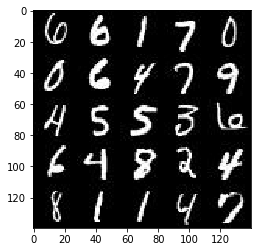

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

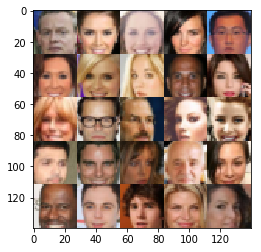

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="real_input")
    z_input = tf.placeholder(tf.float32, [None, z_dim], name="z_input")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    
    return real_input, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.1
    keep_prob = 0.9

    with tf.variable_scope("discriminator", reuse=reuse):
        
        # img size 28*28*3
        x1 = tf.layers.conv2d(images, 32, 5, strides=1, padding="same")
        L_relu1 = tf.maximum(alpha*x1, x1)
        drop1 = tf.nn.dropout(L_relu1, keep_prob=keep_prob)
        
        # img size 28*28*32
        x2 = tf.layers.conv2d(drop1, 64, 5, strides=2, padding="same")
        bn2 = tf.layers.batch_normalization(x2, training=True)
        L_relu2 = tf.maximum(alpha*bn2, bn2)
        drop2 = tf.nn.dropout(L_relu2, keep_prob=keep_prob)
        
        # img size 14*14*64
        x3 = tf.layers.conv2d(drop2, 128, 5, strides=2, padding="same")
        bn3 = tf.layers.batch_normalization(x3, training=True)
        L_relu3 = tf.maximum(alpha*bn3, bn3)
        drop3 = tf.nn.dropout(L_relu3, keep_prob=keep_prob)
        
        # img size 7*7*128
        x4 = tf.layers.conv2d(drop3, 256, 5, strides=1, padding="same")
        bn4 = tf.layers.batch_normalization(x4, training=True)
        L_relu4 = tf.maximum(alpha*bn4, bn4)  
        drop4 = tf.nn.dropout(L_relu4, keep_prob=keep_prob)
        
        # img size 7*7*256
        flattened = tf.reshape(drop4, (-1, 7*7*256))
        logits = tf.layers.dense(flattened, 1)
        output = tf.sigmoid(logits)
        
    
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    reuse = not is_train
    alpha = 0.3
    keep_prob = 0.9
    
    # TODO: Implement Function
    with tf.variable_scope("generator", reuse = reuse):
        
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        L_relu1 = tf.maximum(alpha * bn1, bn1)
        drop1 = tf.nn.dropout(L_relu1, keep_prob=keep_prob)

        # img size is 7*7*512
        x2 = tf.layers.conv2d_transpose(drop1, 256, 5, strides=2, padding="same")
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        L_relu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.nn.dropout(L_relu2, keep_prob=keep_prob)
        
        # img size is 14*14*256
        x3 = tf.layers.conv2d_transpose(drop2, 128, 5, strides=1, padding="same")
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        L_relu3 = tf.maximum(alpha * bn3, bn3)
        drop3 = tf.nn.dropout(L_relu3, keep_prob=keep_prob)
        
        # img size is 14*14*128
        x4 = tf.layers.conv2d_transpose(drop3, 64, 5, strides=2, padding="same")
        bn4 = tf.layers.batch_normalization(x4, training=is_train)
        L_relu4 = tf.maximum(alpha * bn4, bn4)
        drop4 = tf.nn.dropout(L_relu4, keep_prob=keep_prob)
        
        # img size is 28*28*64
        logits = tf.layers.conv2d_transpose(drop4, out_channel_dim, 5, strides=1, padding="same")
        # img size is 28*28*out_channel_dim
        
        output = tf.tanh(logits)
        
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    
    g_out = generator(input_z, out_channel_dim, is_train=True)
    
    d_real_out, d_real_logits = discriminator(input_real)
    d_fake_out, d_fake_logits = discriminator(g_out, reuse=True)    
    
    # discriminator loss
    real_labels = tf.ones_like(d_real_logits) * (1 - smooth)
    real_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=real_labels, logits=d_real_logits))
    
    fake_labels = tf.zeros_like(d_fake_logits) * (1 - smooth)
    fake_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=fake_labels, logits=d_fake_logits))
    
    d_loss = real_loss + fake_loss
    
    # generator loss
    g_labels = tf.ones_like(d_fake_logits) * (1 - smooth)
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=g_labels, logits=d_fake_logits)) 
    
    return d_loss, g_loss
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    trainable_vars = tf.trainable_variables()
    d_vars = [var for var in trainable_vars if var.name.startswith("discriminator")]
    g_vars = [var for var in trainable_vars if var.name.startswith("generator")]

    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list = d_vars)                    
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list = g_vars)

    return d_train_opt, g_train_opt
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    real_input, z_input, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(real_input, z_input, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    saver = tf.train.Saver()
    
    step = 0            
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        
        # load the model
        #saver.restore(sess, './model.ckpt')
        #print("\n loading the model .... ")    
        
        for epoch_i in range(epoch_count):                        
            for batch_images in get_batches(batch_size):
                # TODO: Train Model                                
                batch_images = batch_images * 2
                
                z_batch = np.random.uniform(-1, 1, (batch_size, z_dim))
                
                sess.run(d_train_opt, feed_dict={real_input: batch_images, z_input: z_batch, lr: learning_rate})
                sess.run(g_train_opt, feed_dict={real_input: batch_images, z_input: z_batch, lr: learning_rate})
                
                train_d_loss = d_loss.eval({real_input: batch_images, z_input: z_batch})
                train_g_loss = g_loss.eval({z_input: z_batch})
                
                if(step % 10 == 0):
                    print("Epoch {}/{} ... " .format(epoch_i+1, epoch_count),
                          "Discriminator loss = {:4f}" .format(train_d_loss),
                          "Generator loss = {:4f}" .format(train_g_loss))
                                        
                    
                if(step % 100 == 0):
                    show_generator_output(sess, 25, z_input, data_shape[-1], data_image_mode)
                    # save the model
                    saver.save(sess, './model.ckpt')                      
                    
                step += 1

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 ...  Discriminator loss = 1.559632 Generator loss = 0.591823


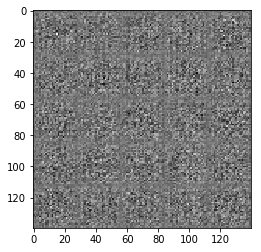

Epoch 1/2 ...  Discriminator loss = 1.017202 Generator loss = 2.094749
Epoch 1/2 ...  Discriminator loss = 1.057206 Generator loss = 0.926648
Epoch 1/2 ...  Discriminator loss = 1.251660 Generator loss = 2.502489
Epoch 1/2 ...  Discriminator loss = 1.348764 Generator loss = 2.732204
Epoch 1/2 ...  Discriminator loss = 1.238669 Generator loss = 1.296285
Epoch 1/2 ...  Discriminator loss = 1.159018 Generator loss = 1.650744
Epoch 1/2 ...  Discriminator loss = 1.232527 Generator loss = 0.935207
Epoch 1/2 ...  Discriminator loss = 1.217532 Generator loss = 0.735376
Epoch 1/2 ...  Discriminator loss = 1.146255 Generator loss = 0.946508
Epoch 1/2 ...  Discriminator loss = 1.331566 Generator loss = 0.773334


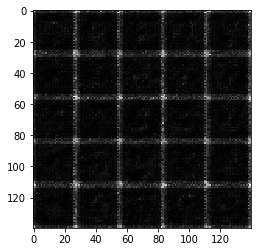

Epoch 1/2 ...  Discriminator loss = 1.284783 Generator loss = 1.333537
Epoch 1/2 ...  Discriminator loss = 1.152096 Generator loss = 1.564683
Epoch 1/2 ...  Discriminator loss = 1.285038 Generator loss = 1.466348
Epoch 1/2 ...  Discriminator loss = 1.154034 Generator loss = 1.661553
Epoch 1/2 ...  Discriminator loss = 1.166766 Generator loss = 0.835913
Epoch 1/2 ...  Discriminator loss = 1.251803 Generator loss = 0.831221
Epoch 1/2 ...  Discriminator loss = 1.172934 Generator loss = 0.881008
Epoch 1/2 ...  Discriminator loss = 1.153782 Generator loss = 1.730348
Epoch 1/2 ...  Discriminator loss = 1.097369 Generator loss = 1.724670
Epoch 1/2 ...  Discriminator loss = 1.186099 Generator loss = 2.353434


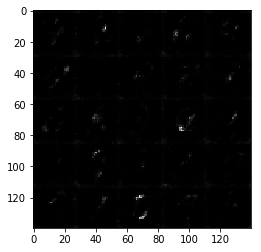

Epoch 1/2 ...  Discriminator loss = 1.194960 Generator loss = 0.716985
Epoch 1/2 ...  Discriminator loss = 0.996227 Generator loss = 1.606107
Epoch 1/2 ...  Discriminator loss = 0.980567 Generator loss = 1.206724
Epoch 1/2 ...  Discriminator loss = 1.005829 Generator loss = 1.028915
Epoch 1/2 ...  Discriminator loss = 0.967195 Generator loss = 1.793041
Epoch 1/2 ...  Discriminator loss = 1.496078 Generator loss = 0.629450
Epoch 1/2 ...  Discriminator loss = 1.097120 Generator loss = 2.176118
Epoch 1/2 ...  Discriminator loss = 1.053802 Generator loss = 0.926150
Epoch 1/2 ...  Discriminator loss = 0.879467 Generator loss = 1.815471
Epoch 1/2 ...  Discriminator loss = 1.002440 Generator loss = 0.985241


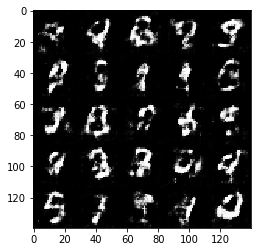

Epoch 1/2 ...  Discriminator loss = 1.167857 Generator loss = 0.855983
Epoch 1/2 ...  Discriminator loss = 0.913909 Generator loss = 1.167474
Epoch 1/2 ...  Discriminator loss = 0.923524 Generator loss = 1.378021
Epoch 1/2 ...  Discriminator loss = 0.997717 Generator loss = 2.134748
Epoch 1/2 ...  Discriminator loss = 1.073599 Generator loss = 1.656069
Epoch 1/2 ...  Discriminator loss = 0.988274 Generator loss = 2.006077
Epoch 1/2 ...  Discriminator loss = 1.044708 Generator loss = 1.620703
Epoch 1/2 ...  Discriminator loss = 1.009886 Generator loss = 1.319034
Epoch 1/2 ...  Discriminator loss = 0.954692 Generator loss = 1.217500
Epoch 1/2 ...  Discriminator loss = 1.005399 Generator loss = 1.257940


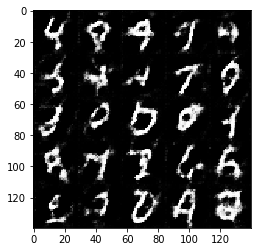

Epoch 1/2 ...  Discriminator loss = 1.199534 Generator loss = 2.115738
Epoch 1/2 ...  Discriminator loss = 1.178319 Generator loss = 1.535151
Epoch 1/2 ...  Discriminator loss = 1.489784 Generator loss = 0.688990
Epoch 1/2 ...  Discriminator loss = 1.287166 Generator loss = 0.707232
Epoch 1/2 ...  Discriminator loss = 1.050519 Generator loss = 1.315702
Epoch 1/2 ...  Discriminator loss = 1.067429 Generator loss = 1.272737
Epoch 1/2 ...  Discriminator loss = 1.231992 Generator loss = 1.701629
Epoch 1/2 ...  Discriminator loss = 1.036619 Generator loss = 1.146521
Epoch 1/2 ...  Discriminator loss = 1.240541 Generator loss = 1.621673
Epoch 1/2 ...  Discriminator loss = 1.302588 Generator loss = 1.482899


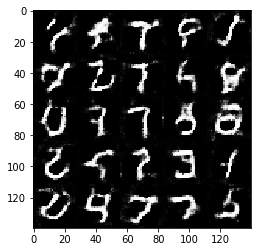

Epoch 1/2 ...  Discriminator loss = 1.130982 Generator loss = 1.129991
Epoch 1/2 ...  Discriminator loss = 1.010400 Generator loss = 1.102668
Epoch 1/2 ...  Discriminator loss = 1.147647 Generator loss = 1.644301
Epoch 1/2 ...  Discriminator loss = 1.166763 Generator loss = 1.118716
Epoch 1/2 ...  Discriminator loss = 1.113854 Generator loss = 1.681471
Epoch 1/2 ...  Discriminator loss = 1.194368 Generator loss = 0.870335
Epoch 1/2 ...  Discriminator loss = 1.052005 Generator loss = 1.074290
Epoch 1/2 ...  Discriminator loss = 1.121024 Generator loss = 1.095632
Epoch 1/2 ...  Discriminator loss = 1.019360 Generator loss = 1.319279
Epoch 1/2 ...  Discriminator loss = 1.129863 Generator loss = 1.701312


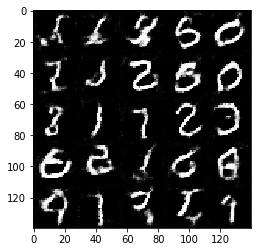

Epoch 1/2 ...  Discriminator loss = 1.077295 Generator loss = 0.962987
Epoch 1/2 ...  Discriminator loss = 1.039471 Generator loss = 1.060316
Epoch 1/2 ...  Discriminator loss = 1.390940 Generator loss = 2.071994
Epoch 1/2 ...  Discriminator loss = 1.138068 Generator loss = 1.467574
Epoch 1/2 ...  Discriminator loss = 0.987290 Generator loss = 1.305394
Epoch 1/2 ...  Discriminator loss = 1.013680 Generator loss = 1.121860
Epoch 1/2 ...  Discriminator loss = 1.007912 Generator loss = 1.542642
Epoch 1/2 ...  Discriminator loss = 1.161926 Generator loss = 1.708295
Epoch 1/2 ...  Discriminator loss = 1.015339 Generator loss = 1.575932
Epoch 1/2 ...  Discriminator loss = 1.058218 Generator loss = 1.273055


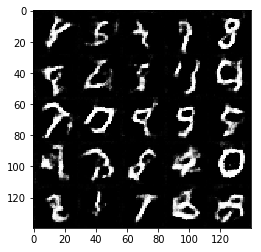

Epoch 1/2 ...  Discriminator loss = 1.108818 Generator loss = 1.000078
Epoch 1/2 ...  Discriminator loss = 1.067942 Generator loss = 1.409251
Epoch 1/2 ...  Discriminator loss = 1.045814 Generator loss = 0.962954
Epoch 1/2 ...  Discriminator loss = 1.142850 Generator loss = 1.055085
Epoch 1/2 ...  Discriminator loss = 1.320823 Generator loss = 0.670597
Epoch 1/2 ...  Discriminator loss = 1.131418 Generator loss = 1.651991
Epoch 1/2 ...  Discriminator loss = 0.979427 Generator loss = 1.304542
Epoch 1/2 ...  Discriminator loss = 1.106020 Generator loss = 1.331296
Epoch 1/2 ...  Discriminator loss = 1.664127 Generator loss = 0.589044
Epoch 1/2 ...  Discriminator loss = 1.016309 Generator loss = 1.841181


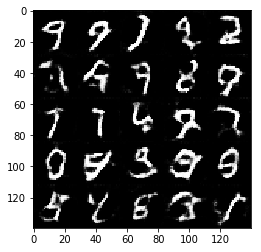

Epoch 1/2 ...  Discriminator loss = 1.258713 Generator loss = 0.757492
Epoch 1/2 ...  Discriminator loss = 0.939122 Generator loss = 1.133187
Epoch 1/2 ...  Discriminator loss = 1.160401 Generator loss = 1.779983
Epoch 1/2 ...  Discriminator loss = 1.025483 Generator loss = 1.449053
Epoch 1/2 ...  Discriminator loss = 1.304538 Generator loss = 0.829803
Epoch 1/2 ...  Discriminator loss = 1.075825 Generator loss = 1.012861
Epoch 1/2 ...  Discriminator loss = 1.150292 Generator loss = 0.749693
Epoch 1/2 ...  Discriminator loss = 0.959942 Generator loss = 0.973988
Epoch 1/2 ...  Discriminator loss = 0.904662 Generator loss = 1.726100
Epoch 1/2 ...  Discriminator loss = 0.982674 Generator loss = 1.709398


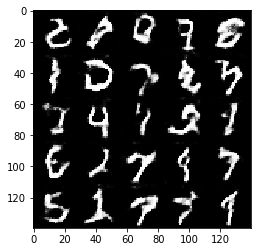

Epoch 1/2 ...  Discriminator loss = 0.869791 Generator loss = 1.478489
Epoch 1/2 ...  Discriminator loss = 0.915063 Generator loss = 1.518930
Epoch 1/2 ...  Discriminator loss = 0.925479 Generator loss = 1.152035
Epoch 2/2 ...  Discriminator loss = 0.855884 Generator loss = 1.411289
Epoch 2/2 ...  Discriminator loss = 1.097807 Generator loss = 2.262668
Epoch 2/2 ...  Discriminator loss = 0.810503 Generator loss = 1.524931
Epoch 2/2 ...  Discriminator loss = 0.981113 Generator loss = 1.566924
Epoch 2/2 ...  Discriminator loss = 0.941320 Generator loss = 1.047680
Epoch 2/2 ...  Discriminator loss = 1.072337 Generator loss = 1.023818
Epoch 2/2 ...  Discriminator loss = 1.048223 Generator loss = 1.161856


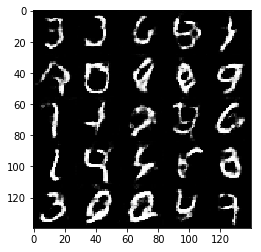

Epoch 2/2 ...  Discriminator loss = 1.376740 Generator loss = 0.631846
Epoch 2/2 ...  Discriminator loss = 0.935343 Generator loss = 1.450993
Epoch 2/2 ...  Discriminator loss = 0.873865 Generator loss = 1.463163
Epoch 2/2 ...  Discriminator loss = 0.931218 Generator loss = 1.302807
Epoch 2/2 ...  Discriminator loss = 1.996150 Generator loss = 0.494575
Epoch 2/2 ...  Discriminator loss = 0.941547 Generator loss = 1.174623
Epoch 2/2 ...  Discriminator loss = 0.831362 Generator loss = 1.234804
Epoch 2/2 ...  Discriminator loss = 1.188684 Generator loss = 0.703438
Epoch 2/2 ...  Discriminator loss = 0.925830 Generator loss = 1.255608
Epoch 2/2 ...  Discriminator loss = 0.864500 Generator loss = 1.539083


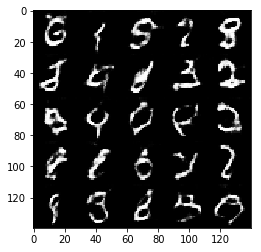

Epoch 2/2 ...  Discriminator loss = 0.839935 Generator loss = 1.522014
Epoch 2/2 ...  Discriminator loss = 1.276924 Generator loss = 0.697900
Epoch 2/2 ...  Discriminator loss = 0.895230 Generator loss = 1.173025
Epoch 2/2 ...  Discriminator loss = 0.762518 Generator loss = 1.840917
Epoch 2/2 ...  Discriminator loss = 0.899539 Generator loss = 1.927469
Epoch 2/2 ...  Discriminator loss = 0.842327 Generator loss = 1.418450
Epoch 2/2 ...  Discriminator loss = 1.599372 Generator loss = 0.575469
Epoch 2/2 ...  Discriminator loss = 0.887374 Generator loss = 1.420683
Epoch 2/2 ...  Discriminator loss = 0.900774 Generator loss = 1.209764
Epoch 2/2 ...  Discriminator loss = 1.021493 Generator loss = 0.885224


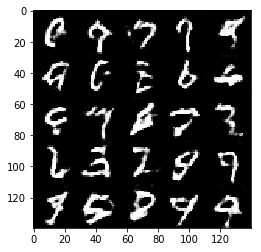

Epoch 2/2 ...  Discriminator loss = 0.746334 Generator loss = 1.490858
Epoch 2/2 ...  Discriminator loss = 0.910533 Generator loss = 1.116145
Epoch 2/2 ...  Discriminator loss = 1.007398 Generator loss = 0.919670
Epoch 2/2 ...  Discriminator loss = 0.954064 Generator loss = 1.362692
Epoch 2/2 ...  Discriminator loss = 0.869898 Generator loss = 1.692497
Epoch 2/2 ...  Discriminator loss = 1.070663 Generator loss = 2.568445
Epoch 2/2 ...  Discriminator loss = 1.003372 Generator loss = 1.026499
Epoch 2/2 ...  Discriminator loss = 0.900765 Generator loss = 1.384351
Epoch 2/2 ...  Discriminator loss = 0.859076 Generator loss = 1.271587
Epoch 2/2 ...  Discriminator loss = 1.092012 Generator loss = 0.727447


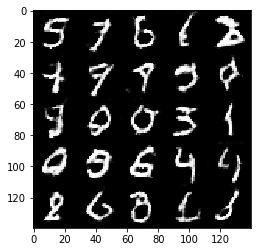

Epoch 2/2 ...  Discriminator loss = 1.103011 Generator loss = 2.863998
Epoch 2/2 ...  Discriminator loss = 0.974017 Generator loss = 1.098866
Epoch 2/2 ...  Discriminator loss = 1.230616 Generator loss = 0.766570
Epoch 2/2 ...  Discriminator loss = 0.953726 Generator loss = 1.059586
Epoch 2/2 ...  Discriminator loss = 0.827516 Generator loss = 2.413899
Epoch 2/2 ...  Discriminator loss = 0.820082 Generator loss = 1.303638
Epoch 2/2 ...  Discriminator loss = 1.019173 Generator loss = 0.836789
Epoch 2/2 ...  Discriminator loss = 0.752504 Generator loss = 1.586749
Epoch 2/2 ...  Discriminator loss = 0.898683 Generator loss = 1.196423
Epoch 2/2 ...  Discriminator loss = 0.882139 Generator loss = 1.360260


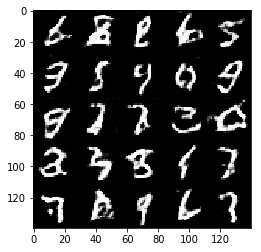

Epoch 2/2 ...  Discriminator loss = 0.817910 Generator loss = 2.131423
Epoch 2/2 ...  Discriminator loss = 1.323133 Generator loss = 0.732928
Epoch 2/2 ...  Discriminator loss = 1.824870 Generator loss = 0.596778
Epoch 2/2 ...  Discriminator loss = 1.015766 Generator loss = 1.081756
Epoch 2/2 ...  Discriminator loss = 0.966870 Generator loss = 1.224803
Epoch 2/2 ...  Discriminator loss = 0.906464 Generator loss = 1.234368
Epoch 2/2 ...  Discriminator loss = 0.700281 Generator loss = 1.517621
Epoch 2/2 ...  Discriminator loss = 0.929529 Generator loss = 1.306305
Epoch 2/2 ...  Discriminator loss = 0.927106 Generator loss = 1.255621
Epoch 2/2 ...  Discriminator loss = 0.882182 Generator loss = 1.448673


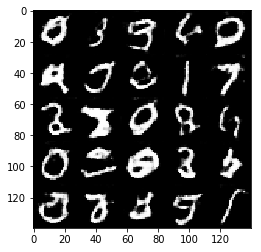

Epoch 2/2 ...  Discriminator loss = 0.616002 Generator loss = 1.875153
Epoch 2/2 ...  Discriminator loss = 0.836918 Generator loss = 1.323904
Epoch 2/2 ...  Discriminator loss = 0.722831 Generator loss = 1.567321
Epoch 2/2 ...  Discriminator loss = 1.016397 Generator loss = 2.349010
Epoch 2/2 ...  Discriminator loss = 1.099842 Generator loss = 0.825662
Epoch 2/2 ...  Discriminator loss = 0.851368 Generator loss = 1.687567
Epoch 2/2 ...  Discriminator loss = 0.860555 Generator loss = 1.953482
Epoch 2/2 ...  Discriminator loss = 1.093647 Generator loss = 0.980299
Epoch 2/2 ...  Discriminator loss = 0.739327 Generator loss = 1.899163
Epoch 2/2 ...  Discriminator loss = 0.787779 Generator loss = 1.867707


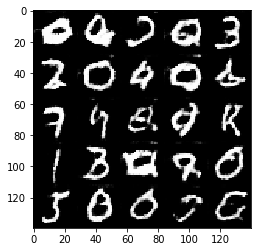

Epoch 2/2 ...  Discriminator loss = 0.743979 Generator loss = 1.560822
Epoch 2/2 ...  Discriminator loss = 0.853182 Generator loss = 2.025927
Epoch 2/2 ...  Discriminator loss = 0.950507 Generator loss = 2.518559
Epoch 2/2 ...  Discriminator loss = 0.835235 Generator loss = 1.780470
Epoch 2/2 ...  Discriminator loss = 0.811194 Generator loss = 1.563403
Epoch 2/2 ...  Discriminator loss = 0.690122 Generator loss = 2.192109
Epoch 2/2 ...  Discriminator loss = 0.844073 Generator loss = 1.460085
Epoch 2/2 ...  Discriminator loss = 0.948085 Generator loss = 1.183373
Epoch 2/2 ...  Discriminator loss = 0.679504 Generator loss = 1.594070
Epoch 2/2 ...  Discriminator loss = 0.844395 Generator loss = 1.382011


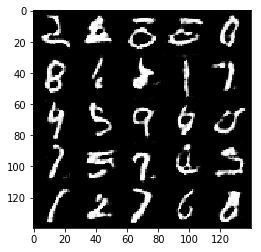

Epoch 2/2 ...  Discriminator loss = 0.848280 Generator loss = 1.208288
Epoch 2/2 ...  Discriminator loss = 0.853014 Generator loss = 1.329056
Epoch 2/2 ...  Discriminator loss = 2.530814 Generator loss = 0.412827
Epoch 2/2 ...  Discriminator loss = 0.913381 Generator loss = 1.350991
Epoch 2/2 ...  Discriminator loss = 0.726631 Generator loss = 1.523715
Epoch 2/2 ...  Discriminator loss = 0.823051 Generator loss = 1.469493
Epoch 2/2 ...  Discriminator loss = 0.892527 Generator loss = 1.370271
Epoch 2/2 ...  Discriminator loss = 0.717232 Generator loss = 2.133641
Epoch 2/2 ...  Discriminator loss = 0.790030 Generator loss = 2.229162
Epoch 2/2 ...  Discriminator loss = 0.920716 Generator loss = 1.228857


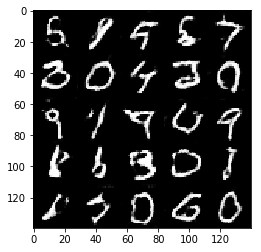

Epoch 2/2 ...  Discriminator loss = 0.978394 Generator loss = 1.162297
Epoch 2/2 ...  Discriminator loss = 0.686095 Generator loss = 1.876726
Epoch 2/2 ...  Discriminator loss = 1.178438 Generator loss = 0.869603
Epoch 2/2 ...  Discriminator loss = 1.048515 Generator loss = 0.956092
Epoch 2/2 ...  Discriminator loss = 0.740417 Generator loss = 1.699576
Epoch 2/2 ...  Discriminator loss = 0.726557 Generator loss = 2.491033
Epoch 2/2 ...  Discriminator loss = 0.945658 Generator loss = 1.122850


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 ...  Discriminator loss = 1.592577 Generator loss = 0.582073


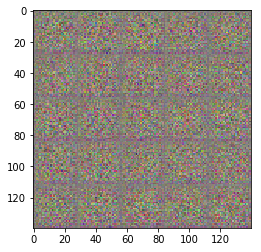

Epoch 1/1 ...  Discriminator loss = 0.814641 Generator loss = 1.516690
Epoch 1/1 ...  Discriminator loss = 0.619808 Generator loss = 1.690409
Epoch 1/1 ...  Discriminator loss = 0.561218 Generator loss = 2.272250
Epoch 1/1 ...  Discriminator loss = 0.582450 Generator loss = 2.046523
Epoch 1/1 ...  Discriminator loss = 0.578072 Generator loss = 2.184719
Epoch 1/1 ...  Discriminator loss = 0.856240 Generator loss = 1.731822
Epoch 1/1 ...  Discriminator loss = 0.532024 Generator loss = 2.365395
Epoch 1/1 ...  Discriminator loss = 0.515971 Generator loss = 2.807127
Epoch 1/1 ...  Discriminator loss = 0.580581 Generator loss = 2.595895
Epoch 1/1 ...  Discriminator loss = 0.506211 Generator loss = 2.622618


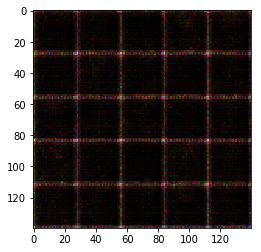

Epoch 1/1 ...  Discriminator loss = 0.561552 Generator loss = 2.376896
Epoch 1/1 ...  Discriminator loss = 0.516345 Generator loss = 2.512932
Epoch 1/1 ...  Discriminator loss = 0.554981 Generator loss = 2.587495
Epoch 1/1 ...  Discriminator loss = 0.440550 Generator loss = 3.451735
Epoch 1/1 ...  Discriminator loss = 0.495752 Generator loss = 2.016329
Epoch 1/1 ...  Discriminator loss = 0.516798 Generator loss = 2.624746
Epoch 1/1 ...  Discriminator loss = 0.471723 Generator loss = 3.020332
Epoch 1/1 ...  Discriminator loss = 0.466532 Generator loss = 2.442452
Epoch 1/1 ...  Discriminator loss = 0.434096 Generator loss = 3.394266
Epoch 1/1 ...  Discriminator loss = 0.522629 Generator loss = 3.394247


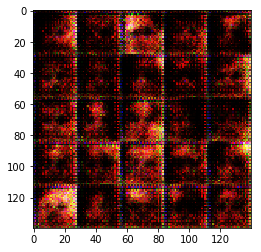

Epoch 1/1 ...  Discriminator loss = 0.452438 Generator loss = 2.857900
Epoch 1/1 ...  Discriminator loss = 0.544734 Generator loss = 2.920830
Epoch 1/1 ...  Discriminator loss = 0.482997 Generator loss = 2.676519
Epoch 1/1 ...  Discriminator loss = 1.435857 Generator loss = 5.893153
Epoch 1/1 ...  Discriminator loss = 0.571409 Generator loss = 1.894799
Epoch 1/1 ...  Discriminator loss = 1.124885 Generator loss = 1.227326
Epoch 1/1 ...  Discriminator loss = 0.586660 Generator loss = 1.943853
Epoch 1/1 ...  Discriminator loss = 0.436150 Generator loss = 3.148892
Epoch 1/1 ...  Discriminator loss = 0.397208 Generator loss = 3.938452
Epoch 1/1 ...  Discriminator loss = 0.449661 Generator loss = 2.583647


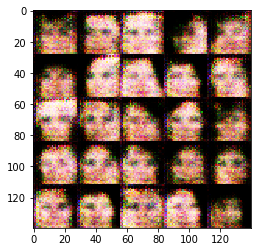

Epoch 1/1 ...  Discriminator loss = 0.522513 Generator loss = 1.981474
Epoch 1/1 ...  Discriminator loss = 0.432908 Generator loss = 3.304409
Epoch 1/1 ...  Discriminator loss = 0.416989 Generator loss = 3.974401
Epoch 1/1 ...  Discriminator loss = 0.675086 Generator loss = 2.564622
Epoch 1/1 ...  Discriminator loss = 0.474429 Generator loss = 2.578357
Epoch 1/1 ...  Discriminator loss = 0.541198 Generator loss = 2.615660
Epoch 1/1 ...  Discriminator loss = 0.596867 Generator loss = 2.563905
Epoch 1/1 ...  Discriminator loss = 0.681313 Generator loss = 1.752300
Epoch 1/1 ...  Discriminator loss = 1.922117 Generator loss = 0.536762
Epoch 1/1 ...  Discriminator loss = 0.974702 Generator loss = 0.993080


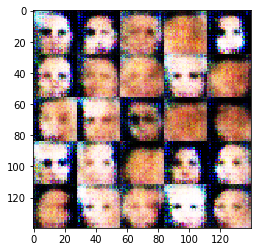

Epoch 1/1 ...  Discriminator loss = 0.796317 Generator loss = 1.672989
Epoch 1/1 ...  Discriminator loss = 0.676885 Generator loss = 1.819906
Epoch 1/1 ...  Discriminator loss = 0.876595 Generator loss = 1.050117
Epoch 1/1 ...  Discriminator loss = 0.717764 Generator loss = 1.661736
Epoch 1/1 ...  Discriminator loss = 0.609952 Generator loss = 1.977105
Epoch 1/1 ...  Discriminator loss = 0.718486 Generator loss = 1.931122
Epoch 1/1 ...  Discriminator loss = 0.598248 Generator loss = 1.960685
Epoch 1/1 ...  Discriminator loss = 0.500335 Generator loss = 2.777141
Epoch 1/1 ...  Discriminator loss = 0.651458 Generator loss = 2.377430
Epoch 1/1 ...  Discriminator loss = 0.660075 Generator loss = 2.092826


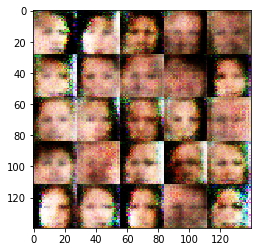

Epoch 1/1 ...  Discriminator loss = 0.737776 Generator loss = 2.248741
Epoch 1/1 ...  Discriminator loss = 1.081578 Generator loss = 1.224983
Epoch 1/1 ...  Discriminator loss = 0.728032 Generator loss = 1.455963
Epoch 1/1 ...  Discriminator loss = 1.686483 Generator loss = 0.474929
Epoch 1/1 ...  Discriminator loss = 0.923117 Generator loss = 1.212861
Epoch 1/1 ...  Discriminator loss = 0.601835 Generator loss = 1.642312
Epoch 1/1 ...  Discriminator loss = 0.650313 Generator loss = 1.424304
Epoch 1/1 ...  Discriminator loss = 0.677151 Generator loss = 2.064487
Epoch 1/1 ...  Discriminator loss = 0.854987 Generator loss = 1.664087
Epoch 1/1 ...  Discriminator loss = 0.801524 Generator loss = 1.219402


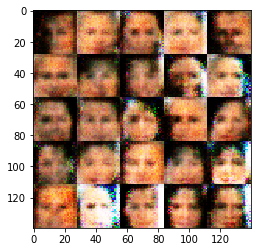

Epoch 1/1 ...  Discriminator loss = 1.632995 Generator loss = 0.700198
Epoch 1/1 ...  Discriminator loss = 0.495266 Generator loss = 2.557788
Epoch 1/1 ...  Discriminator loss = 0.557744 Generator loss = 2.327308
Epoch 1/1 ...  Discriminator loss = 0.593752 Generator loss = 1.752717
Epoch 1/1 ...  Discriminator loss = 0.656838 Generator loss = 1.965432
Epoch 1/1 ...  Discriminator loss = 0.816833 Generator loss = 1.204867
Epoch 1/1 ...  Discriminator loss = 0.597043 Generator loss = 2.459003
Epoch 1/1 ...  Discriminator loss = 0.687302 Generator loss = 1.653369
Epoch 1/1 ...  Discriminator loss = 0.668414 Generator loss = 2.362777
Epoch 1/1 ...  Discriminator loss = 0.793209 Generator loss = 1.529201


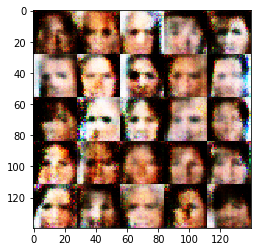

Epoch 1/1 ...  Discriminator loss = 0.596213 Generator loss = 2.422519
Epoch 1/1 ...  Discriminator loss = 0.667880 Generator loss = 1.956127
Epoch 1/1 ...  Discriminator loss = 0.585053 Generator loss = 2.196421
Epoch 1/1 ...  Discriminator loss = 0.929598 Generator loss = 1.321581
Epoch 1/1 ...  Discriminator loss = 1.015041 Generator loss = 1.247676
Epoch 1/1 ...  Discriminator loss = 0.775794 Generator loss = 1.504146
Epoch 1/1 ...  Discriminator loss = 0.711918 Generator loss = 2.340264
Epoch 1/1 ...  Discriminator loss = 0.668536 Generator loss = 1.658082
Epoch 1/1 ...  Discriminator loss = 2.756997 Generator loss = 5.855017
Epoch 1/1 ...  Discriminator loss = 0.961922 Generator loss = 1.715996


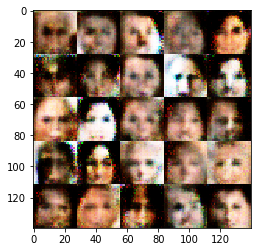

Epoch 1/1 ...  Discriminator loss = 0.764385 Generator loss = 1.191794
Epoch 1/1 ...  Discriminator loss = 0.682662 Generator loss = 1.868417
Epoch 1/1 ...  Discriminator loss = 0.646167 Generator loss = 1.631541
Epoch 1/1 ...  Discriminator loss = 0.700012 Generator loss = 2.242769
Epoch 1/1 ...  Discriminator loss = 1.141783 Generator loss = 0.995883
Epoch 1/1 ...  Discriminator loss = 0.606271 Generator loss = 2.489490
Epoch 1/1 ...  Discriminator loss = 0.885192 Generator loss = 2.149714
Epoch 1/1 ...  Discriminator loss = 1.351208 Generator loss = 0.768294
Epoch 1/1 ...  Discriminator loss = 0.990169 Generator loss = 0.934240
Epoch 1/1 ...  Discriminator loss = 0.990504 Generator loss = 0.968104


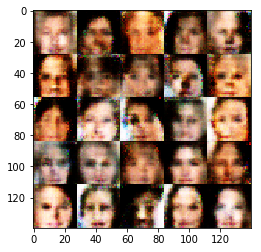

Epoch 1/1 ...  Discriminator loss = 0.618409 Generator loss = 2.136344
Epoch 1/1 ...  Discriminator loss = 1.047959 Generator loss = 3.798256
Epoch 1/1 ...  Discriminator loss = 0.831193 Generator loss = 1.985856
Epoch 1/1 ...  Discriminator loss = 0.818478 Generator loss = 1.818053
Epoch 1/1 ...  Discriminator loss = 0.797601 Generator loss = 1.339695
Epoch 1/1 ...  Discriminator loss = 0.970787 Generator loss = 1.055039
Epoch 1/1 ...  Discriminator loss = 0.911455 Generator loss = 2.961057
Epoch 1/1 ...  Discriminator loss = 0.783002 Generator loss = 2.224357
Epoch 1/1 ...  Discriminator loss = 1.187063 Generator loss = 0.850205
Epoch 1/1 ...  Discriminator loss = 0.854633 Generator loss = 2.056291


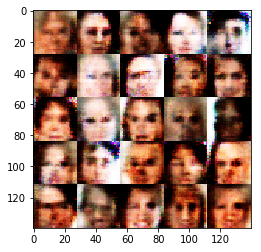

Epoch 1/1 ...  Discriminator loss = 0.809713 Generator loss = 1.502554
Epoch 1/1 ...  Discriminator loss = 1.103003 Generator loss = 0.826630
Epoch 1/1 ...  Discriminator loss = 0.846934 Generator loss = 2.413430
Epoch 1/1 ...  Discriminator loss = 0.833196 Generator loss = 1.397265
Epoch 1/1 ...  Discriminator loss = 0.737012 Generator loss = 1.199563
Epoch 1/1 ...  Discriminator loss = 0.701519 Generator loss = 2.598002
Epoch 1/1 ...  Discriminator loss = 1.789657 Generator loss = 0.518432
Epoch 1/1 ...  Discriminator loss = 0.719647 Generator loss = 1.800047
Epoch 1/1 ...  Discriminator loss = 1.252346 Generator loss = 0.924357
Epoch 1/1 ...  Discriminator loss = 0.782051 Generator loss = 1.401861


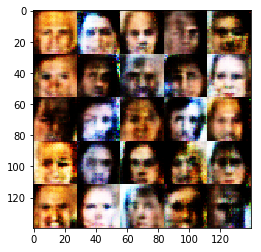

Epoch 1/1 ...  Discriminator loss = 0.639888 Generator loss = 1.920217
Epoch 1/1 ...  Discriminator loss = 1.005880 Generator loss = 1.321670
Epoch 1/1 ...  Discriminator loss = 1.369770 Generator loss = 0.851668
Epoch 1/1 ...  Discriminator loss = 1.138831 Generator loss = 1.328470
Epoch 1/1 ...  Discriminator loss = 2.588151 Generator loss = 3.941458
Epoch 1/1 ...  Discriminator loss = 1.143272 Generator loss = 2.250789
Epoch 1/1 ...  Discriminator loss = 0.954947 Generator loss = 1.210539
Epoch 1/1 ...  Discriminator loss = 0.782439 Generator loss = 2.361496
Epoch 1/1 ...  Discriminator loss = 0.702331 Generator loss = 1.626800
Epoch 1/1 ...  Discriminator loss = 0.642622 Generator loss = 1.544472


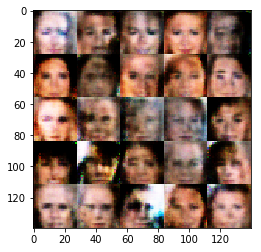

Epoch 1/1 ...  Discriminator loss = 0.651182 Generator loss = 2.348380
Epoch 1/1 ...  Discriminator loss = 0.725723 Generator loss = 1.321611
Epoch 1/1 ...  Discriminator loss = 0.614170 Generator loss = 2.135099
Epoch 1/1 ...  Discriminator loss = 0.699402 Generator loss = 2.096213
Epoch 1/1 ...  Discriminator loss = 1.319006 Generator loss = 1.404298
Epoch 1/1 ...  Discriminator loss = 0.898712 Generator loss = 1.536108
Epoch 1/1 ...  Discriminator loss = 1.011571 Generator loss = 1.245842
Epoch 1/1 ...  Discriminator loss = 0.595974 Generator loss = 2.149151
Epoch 1/1 ...  Discriminator loss = 0.987990 Generator loss = 2.413429
Epoch 1/1 ...  Discriminator loss = 1.036976 Generator loss = 0.788109


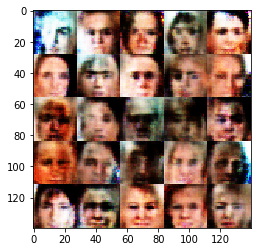

Epoch 1/1 ...  Discriminator loss = 1.145265 Generator loss = 1.888710
Epoch 1/1 ...  Discriminator loss = 1.162996 Generator loss = 0.788936
Epoch 1/1 ...  Discriminator loss = 0.710350 Generator loss = 1.968809
Epoch 1/1 ...  Discriminator loss = 1.157552 Generator loss = 1.054710
Epoch 1/1 ...  Discriminator loss = 0.995315 Generator loss = 1.191095
Epoch 1/1 ...  Discriminator loss = 0.792277 Generator loss = 1.462407
Epoch 1/1 ...  Discriminator loss = 0.618888 Generator loss = 1.786497
Epoch 1/1 ...  Discriminator loss = 0.666291 Generator loss = 1.871685
Epoch 1/1 ...  Discriminator loss = 0.964120 Generator loss = 2.112133
Epoch 1/1 ...  Discriminator loss = 0.864204 Generator loss = 1.621435


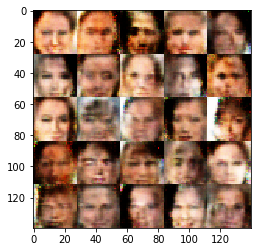

Epoch 1/1 ...  Discriminator loss = 0.779459 Generator loss = 1.088594
Epoch 1/1 ...  Discriminator loss = 1.155212 Generator loss = 1.162629
Epoch 1/1 ...  Discriminator loss = 0.666379 Generator loss = 1.542407
Epoch 1/1 ...  Discriminator loss = 1.957942 Generator loss = 0.477015
Epoch 1/1 ...  Discriminator loss = 0.834009 Generator loss = 1.920364
Epoch 1/1 ...  Discriminator loss = 0.872548 Generator loss = 1.276450
Epoch 1/1 ...  Discriminator loss = 0.883579 Generator loss = 1.496586
Epoch 1/1 ...  Discriminator loss = 1.146020 Generator loss = 0.993261
Epoch 1/1 ...  Discriminator loss = 0.734395 Generator loss = 1.364554
Epoch 1/1 ...  Discriminator loss = 1.389197 Generator loss = 0.882350


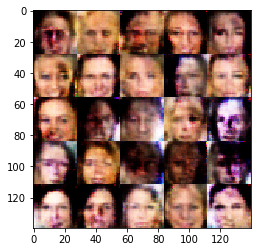

Epoch 1/1 ...  Discriminator loss = 1.009464 Generator loss = 1.375972
Epoch 1/1 ...  Discriminator loss = 0.940034 Generator loss = 2.827692
Epoch 1/1 ...  Discriminator loss = 1.002645 Generator loss = 1.505064
Epoch 1/1 ...  Discriminator loss = 0.880142 Generator loss = 1.719419
Epoch 1/1 ...  Discriminator loss = 1.119183 Generator loss = 1.893749
Epoch 1/1 ...  Discriminator loss = 0.739451 Generator loss = 1.588574
Epoch 1/1 ...  Discriminator loss = 1.357908 Generator loss = 0.720638
Epoch 1/1 ...  Discriminator loss = 0.703403 Generator loss = 1.613704
Epoch 1/1 ...  Discriminator loss = 0.998176 Generator loss = 1.634878
Epoch 1/1 ...  Discriminator loss = 1.026517 Generator loss = 2.231274


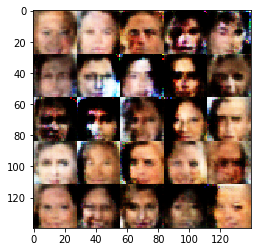

Epoch 1/1 ...  Discriminator loss = 1.272501 Generator loss = 1.041279
Epoch 1/1 ...  Discriminator loss = 0.748077 Generator loss = 1.954804
Epoch 1/1 ...  Discriminator loss = 0.604892 Generator loss = 1.347370
Epoch 1/1 ...  Discriminator loss = 1.151222 Generator loss = 0.667211
Epoch 1/1 ...  Discriminator loss = 1.031905 Generator loss = 1.886457
Epoch 1/1 ...  Discriminator loss = 0.997274 Generator loss = 1.465640
Epoch 1/1 ...  Discriminator loss = 1.328422 Generator loss = 0.645742
Epoch 1/1 ...  Discriminator loss = 0.619501 Generator loss = 1.941812
Epoch 1/1 ...  Discriminator loss = 0.790358 Generator loss = 0.958723
Epoch 1/1 ...  Discriminator loss = 0.815480 Generator loss = 2.277754


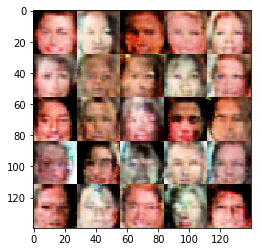

Epoch 1/1 ...  Discriminator loss = 0.807944 Generator loss = 1.500162
Epoch 1/1 ...  Discriminator loss = 1.162325 Generator loss = 0.750289
Epoch 1/1 ...  Discriminator loss = 1.493703 Generator loss = 0.544398
Epoch 1/1 ...  Discriminator loss = 0.940041 Generator loss = 2.823703
Epoch 1/1 ...  Discriminator loss = 1.045748 Generator loss = 1.000002
Epoch 1/1 ...  Discriminator loss = 1.032282 Generator loss = 1.387457
Epoch 1/1 ...  Discriminator loss = 1.456277 Generator loss = 0.645730
Epoch 1/1 ...  Discriminator loss = 1.208022 Generator loss = 1.190411
Epoch 1/1 ...  Discriminator loss = 0.981854 Generator loss = 1.919863
Epoch 1/1 ...  Discriminator loss = 0.877906 Generator loss = 1.635612


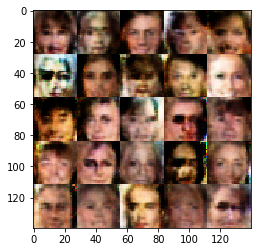

Epoch 1/1 ...  Discriminator loss = 1.323923 Generator loss = 0.591859
Epoch 1/1 ...  Discriminator loss = 0.888383 Generator loss = 1.522165
Epoch 1/1 ...  Discriminator loss = 0.685457 Generator loss = 1.924282
Epoch 1/1 ...  Discriminator loss = 1.058083 Generator loss = 0.974168
Epoch 1/1 ...  Discriminator loss = 1.331020 Generator loss = 0.719850
Epoch 1/1 ...  Discriminator loss = 0.904993 Generator loss = 1.262514
Epoch 1/1 ...  Discriminator loss = 0.694295 Generator loss = 1.571801
Epoch 1/1 ...  Discriminator loss = 0.873879 Generator loss = 1.580257
Epoch 1/1 ...  Discriminator loss = 0.672581 Generator loss = 1.965382
Epoch 1/1 ...  Discriminator loss = 0.723700 Generator loss = 1.625272


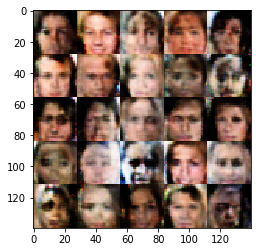

Epoch 1/1 ...  Discriminator loss = 0.673565 Generator loss = 1.584629
Epoch 1/1 ...  Discriminator loss = 0.889505 Generator loss = 1.266756
Epoch 1/1 ...  Discriminator loss = 0.825568 Generator loss = 1.278503
Epoch 1/1 ...  Discriminator loss = 0.939583 Generator loss = 2.223468
Epoch 1/1 ...  Discriminator loss = 0.836493 Generator loss = 1.787965
Epoch 1/1 ...  Discriminator loss = 1.146372 Generator loss = 1.309412
Epoch 1/1 ...  Discriminator loss = 0.933524 Generator loss = 1.971321
Epoch 1/1 ...  Discriminator loss = 1.141949 Generator loss = 1.024295
Epoch 1/1 ...  Discriminator loss = 1.445329 Generator loss = 0.681810
Epoch 1/1 ...  Discriminator loss = 0.758351 Generator loss = 1.355747


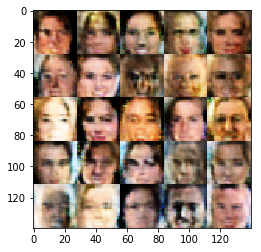

Epoch 1/1 ...  Discriminator loss = 0.743248 Generator loss = 1.603815
Epoch 1/1 ...  Discriminator loss = 0.949715 Generator loss = 1.556783
Epoch 1/1 ...  Discriminator loss = 1.150151 Generator loss = 0.865618
Epoch 1/1 ...  Discriminator loss = 0.960655 Generator loss = 1.842346
Epoch 1/1 ...  Discriminator loss = 0.734110 Generator loss = 1.956493
Epoch 1/1 ...  Discriminator loss = 0.850501 Generator loss = 1.474508
Epoch 1/1 ...  Discriminator loss = 0.953043 Generator loss = 1.294979
Epoch 1/1 ...  Discriminator loss = 1.308405 Generator loss = 1.473180
Epoch 1/1 ...  Discriminator loss = 0.854026 Generator loss = 1.736881
Epoch 1/1 ...  Discriminator loss = 1.038538 Generator loss = 1.273758


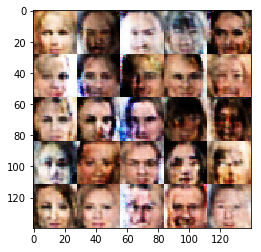

Epoch 1/1 ...  Discriminator loss = 0.819396 Generator loss = 1.613605
Epoch 1/1 ...  Discriminator loss = 0.780689 Generator loss = 1.458529
Epoch 1/1 ...  Discriminator loss = 0.798034 Generator loss = 1.222472
Epoch 1/1 ...  Discriminator loss = 0.795473 Generator loss = 1.762073
Epoch 1/1 ...  Discriminator loss = 1.390592 Generator loss = 0.808960
Epoch 1/1 ...  Discriminator loss = 1.021798 Generator loss = 1.356333
Epoch 1/1 ...  Discriminator loss = 1.100719 Generator loss = 2.280348
Epoch 1/1 ...  Discriminator loss = 0.654655 Generator loss = 2.150381
Epoch 1/1 ...  Discriminator loss = 1.115355 Generator loss = 0.978884
Epoch 1/1 ...  Discriminator loss = 1.120788 Generator loss = 1.175491


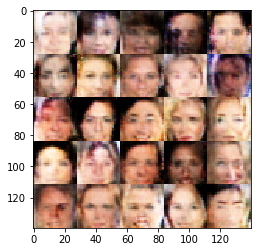

Epoch 1/1 ...  Discriminator loss = 0.885169 Generator loss = 0.969421
Epoch 1/1 ...  Discriminator loss = 1.147466 Generator loss = 1.036706
Epoch 1/1 ...  Discriminator loss = 1.256412 Generator loss = 0.634024
Epoch 1/1 ...  Discriminator loss = 1.013095 Generator loss = 0.954634
Epoch 1/1 ...  Discriminator loss = 1.096324 Generator loss = 1.519135
Epoch 1/1 ...  Discriminator loss = 0.963745 Generator loss = 1.821792
Epoch 1/1 ...  Discriminator loss = 1.071157 Generator loss = 1.105601
Epoch 1/1 ...  Discriminator loss = 0.957714 Generator loss = 1.103469
Epoch 1/1 ...  Discriminator loss = 1.148305 Generator loss = 1.066561
Epoch 1/1 ...  Discriminator loss = 1.299012 Generator loss = 0.950487


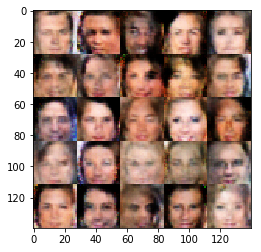

Epoch 1/1 ...  Discriminator loss = 0.882857 Generator loss = 2.018277
Epoch 1/1 ...  Discriminator loss = 1.028752 Generator loss = 1.632199
Epoch 1/1 ...  Discriminator loss = 1.032540 Generator loss = 0.951641
Epoch 1/1 ...  Discriminator loss = 1.160037 Generator loss = 2.225936
Epoch 1/1 ...  Discriminator loss = 1.287067 Generator loss = 0.818028
Epoch 1/1 ...  Discriminator loss = 1.197884 Generator loss = 0.711093
Epoch 1/1 ...  Discriminator loss = 0.883442 Generator loss = 1.092947
Epoch 1/1 ...  Discriminator loss = 0.933322 Generator loss = 1.164301
Epoch 1/1 ...  Discriminator loss = 1.308254 Generator loss = 0.622642
Epoch 1/1 ...  Discriminator loss = 0.686795 Generator loss = 1.713256


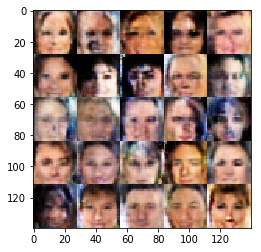

Epoch 1/1 ...  Discriminator loss = 1.209970 Generator loss = 0.978090
Epoch 1/1 ...  Discriminator loss = 1.516713 Generator loss = 0.545253
Epoch 1/1 ...  Discriminator loss = 0.973891 Generator loss = 1.198351
Epoch 1/1 ...  Discriminator loss = 1.129045 Generator loss = 0.846732
Epoch 1/1 ...  Discriminator loss = 0.775342 Generator loss = 1.503544
Epoch 1/1 ...  Discriminator loss = 0.892219 Generator loss = 1.379788
Epoch 1/1 ...  Discriminator loss = 0.846334 Generator loss = 1.255382
Epoch 1/1 ...  Discriminator loss = 1.075539 Generator loss = 0.974816
Epoch 1/1 ...  Discriminator loss = 1.045934 Generator loss = 1.190828
Epoch 1/1 ...  Discriminator loss = 0.753164 Generator loss = 1.429830


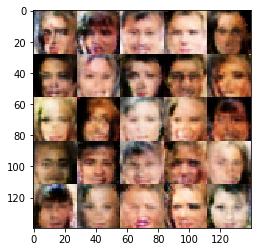

Epoch 1/1 ...  Discriminator loss = 0.950882 Generator loss = 1.030843
Epoch 1/1 ...  Discriminator loss = 0.870848 Generator loss = 1.287339
Epoch 1/1 ...  Discriminator loss = 1.034051 Generator loss = 1.368744
Epoch 1/1 ...  Discriminator loss = 1.005486 Generator loss = 1.253078
Epoch 1/1 ...  Discriminator loss = 1.459200 Generator loss = 0.699521
Epoch 1/1 ...  Discriminator loss = 1.069890 Generator loss = 0.942702
Epoch 1/1 ...  Discriminator loss = 0.938955 Generator loss = 1.350801
Epoch 1/1 ...  Discriminator loss = 1.042765 Generator loss = 1.186124
Epoch 1/1 ...  Discriminator loss = 0.976262 Generator loss = 1.397022
Epoch 1/1 ...  Discriminator loss = 1.163971 Generator loss = 0.679385


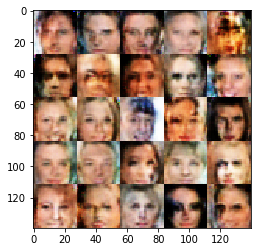

Epoch 1/1 ...  Discriminator loss = 0.931290 Generator loss = 1.086507
Epoch 1/1 ...  Discriminator loss = 1.166618 Generator loss = 0.780604
Epoch 1/1 ...  Discriminator loss = 1.016089 Generator loss = 1.077733
Epoch 1/1 ...  Discriminator loss = 1.351325 Generator loss = 0.742570
Epoch 1/1 ...  Discriminator loss = 1.333533 Generator loss = 0.954094
Epoch 1/1 ...  Discriminator loss = 0.764666 Generator loss = 1.956632
Epoch 1/1 ...  Discriminator loss = 1.253947 Generator loss = 0.569935
Epoch 1/1 ...  Discriminator loss = 1.324221 Generator loss = 0.768402
Epoch 1/1 ...  Discriminator loss = 1.255337 Generator loss = 0.750382
Epoch 1/1 ...  Discriminator loss = 1.165323 Generator loss = 0.718770


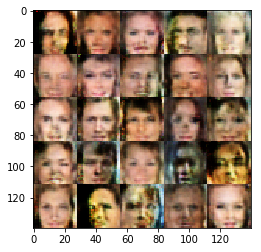

Epoch 1/1 ...  Discriminator loss = 0.932143 Generator loss = 1.141591
Epoch 1/1 ...  Discriminator loss = 1.160445 Generator loss = 1.805856
Epoch 1/1 ...  Discriminator loss = 0.953829 Generator loss = 0.873756
Epoch 1/1 ...  Discriminator loss = 1.129246 Generator loss = 0.835965
Epoch 1/1 ...  Discriminator loss = 1.005479 Generator loss = 1.404561
Epoch 1/1 ...  Discriminator loss = 1.337219 Generator loss = 0.594847
Epoch 1/1 ...  Discriminator loss = 1.004360 Generator loss = 1.258920
Epoch 1/1 ...  Discriminator loss = 1.087111 Generator loss = 0.784061
Epoch 1/1 ...  Discriminator loss = 1.566535 Generator loss = 0.716873
Epoch 1/1 ...  Discriminator loss = 1.208344 Generator loss = 0.858005


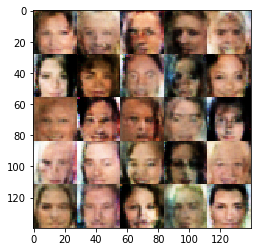

Epoch 1/1 ...  Discriminator loss = 0.855340 Generator loss = 1.485662
Epoch 1/1 ...  Discriminator loss = 1.029580 Generator loss = 1.078640
Epoch 1/1 ...  Discriminator loss = 1.061708 Generator loss = 0.785931
Epoch 1/1 ...  Discriminator loss = 0.968700 Generator loss = 1.349888
Epoch 1/1 ...  Discriminator loss = 0.928033 Generator loss = 1.163275
Epoch 1/1 ...  Discriminator loss = 1.287230 Generator loss = 1.078527
Epoch 1/1 ...  Discriminator loss = 0.941161 Generator loss = 1.059449
Epoch 1/1 ...  Discriminator loss = 1.160898 Generator loss = 0.880876
Epoch 1/1 ...  Discriminator loss = 1.189098 Generator loss = 1.757570
Epoch 1/1 ...  Discriminator loss = 1.797849 Generator loss = 2.142913


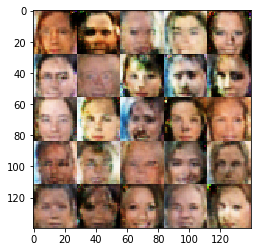

Epoch 1/1 ...  Discriminator loss = 1.266579 Generator loss = 0.850611
Epoch 1/1 ...  Discriminator loss = 1.076037 Generator loss = 1.251220
Epoch 1/1 ...  Discriminator loss = 0.787675 Generator loss = 1.793401
Epoch 1/1 ...  Discriminator loss = 1.090118 Generator loss = 0.832005
Epoch 1/1 ...  Discriminator loss = 1.020256 Generator loss = 1.360402
Epoch 1/1 ...  Discriminator loss = 0.776462 Generator loss = 1.855690
Epoch 1/1 ...  Discriminator loss = 1.015607 Generator loss = 1.006728
Epoch 1/1 ...  Discriminator loss = 1.297711 Generator loss = 0.627415
Epoch 1/1 ...  Discriminator loss = 1.489808 Generator loss = 0.828110
Epoch 1/1 ...  Discriminator loss = 0.951229 Generator loss = 1.384747


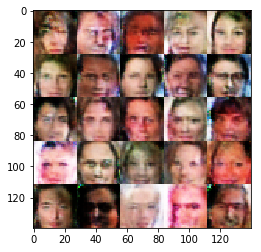

Epoch 1/1 ...  Discriminator loss = 1.090121 Generator loss = 1.162307
Epoch 1/1 ...  Discriminator loss = 1.184706 Generator loss = 0.935152
Epoch 1/1 ...  Discriminator loss = 1.290566 Generator loss = 0.742397
Epoch 1/1 ...  Discriminator loss = 1.091303 Generator loss = 1.682854
Epoch 1/1 ...  Discriminator loss = 1.051838 Generator loss = 0.794408
Epoch 1/1 ...  Discriminator loss = 1.459906 Generator loss = 0.827421
Epoch 1/1 ...  Discriminator loss = 1.067560 Generator loss = 0.866319
Epoch 1/1 ...  Discriminator loss = 0.858017 Generator loss = 1.076379
Epoch 1/1 ...  Discriminator loss = 0.832839 Generator loss = 1.608174
Epoch 1/1 ...  Discriminator loss = 0.985637 Generator loss = 0.932638


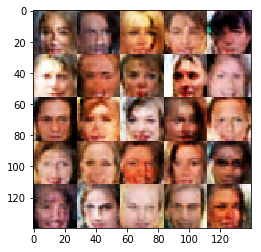

Epoch 1/1 ...  Discriminator loss = 1.362180 Generator loss = 0.753178
Epoch 1/1 ...  Discriminator loss = 0.850749 Generator loss = 1.383668
Epoch 1/1 ...  Discriminator loss = 1.242706 Generator loss = 1.174478
Epoch 1/1 ...  Discriminator loss = 1.155518 Generator loss = 1.084863
Epoch 1/1 ...  Discriminator loss = 0.931660 Generator loss = 0.856955
Epoch 1/1 ...  Discriminator loss = 1.592912 Generator loss = 0.903259
Epoch 1/1 ...  Discriminator loss = 1.353587 Generator loss = 0.620138
Epoch 1/1 ...  Discriminator loss = 1.688920 Generator loss = 0.678824
Epoch 1/1 ...  Discriminator loss = 1.119543 Generator loss = 1.527327
Epoch 1/1 ...  Discriminator loss = 1.503277 Generator loss = 0.617417


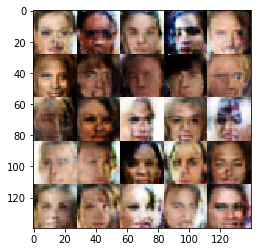

Epoch 1/1 ...  Discriminator loss = 1.198020 Generator loss = 0.645512
Epoch 1/1 ...  Discriminator loss = 1.191102 Generator loss = 1.536148
Epoch 1/1 ...  Discriminator loss = 0.784177 Generator loss = 0.995368
Epoch 1/1 ...  Discriminator loss = 1.241227 Generator loss = 0.705078
Epoch 1/1 ...  Discriminator loss = 1.056280 Generator loss = 1.286299
Epoch 1/1 ...  Discriminator loss = 1.152259 Generator loss = 0.847104
Epoch 1/1 ...  Discriminator loss = 0.774374 Generator loss = 1.475286
Epoch 1/1 ...  Discriminator loss = 1.289324 Generator loss = 0.644671
Epoch 1/1 ...  Discriminator loss = 1.052667 Generator loss = 0.843092
Epoch 1/1 ...  Discriminator loss = 0.770787 Generator loss = 1.157607


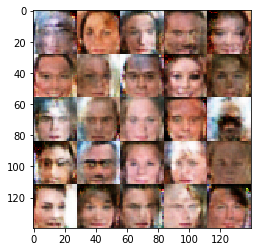

Epoch 1/1 ...  Discriminator loss = 1.319804 Generator loss = 1.055409
Epoch 1/1 ...  Discriminator loss = 0.847253 Generator loss = 1.559867
Epoch 1/1 ...  Discriminator loss = 1.135363 Generator loss = 1.224079
Epoch 1/1 ...  Discriminator loss = 0.907184 Generator loss = 1.116701
Epoch 1/1 ...  Discriminator loss = 1.258343 Generator loss = 1.011173
Epoch 1/1 ...  Discriminator loss = 1.232131 Generator loss = 0.973676
Epoch 1/1 ...  Discriminator loss = 1.170352 Generator loss = 0.699572
Epoch 1/1 ...  Discriminator loss = 1.005307 Generator loss = 1.408106
Epoch 1/1 ...  Discriminator loss = 0.911530 Generator loss = 1.059517
Epoch 1/1 ...  Discriminator loss = 1.043593 Generator loss = 0.665525


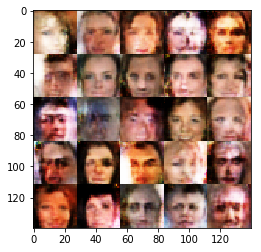

Epoch 1/1 ...  Discriminator loss = 1.467937 Generator loss = 0.620374
Epoch 1/1 ...  Discriminator loss = 1.097994 Generator loss = 1.039381
Epoch 1/1 ...  Discriminator loss = 1.024661 Generator loss = 0.913240
Epoch 1/1 ...  Discriminator loss = 1.079098 Generator loss = 0.835641
Epoch 1/1 ...  Discriminator loss = 0.895813 Generator loss = 0.904659
Epoch 1/1 ...  Discriminator loss = 1.241363 Generator loss = 0.858449
Epoch 1/1 ...  Discriminator loss = 0.774469 Generator loss = 1.499354
Epoch 1/1 ...  Discriminator loss = 0.972252 Generator loss = 1.003056
Epoch 1/1 ...  Discriminator loss = 1.262445 Generator loss = 0.781961
Epoch 1/1 ...  Discriminator loss = 0.969281 Generator loss = 1.047226


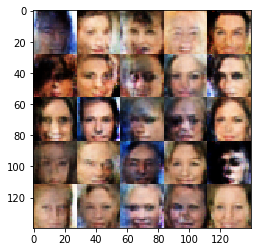

Epoch 1/1 ...  Discriminator loss = 1.318264 Generator loss = 0.667235
Epoch 1/1 ...  Discriminator loss = 1.421665 Generator loss = 1.327934
Epoch 1/1 ...  Discriminator loss = 1.058672 Generator loss = 1.119386
Epoch 1/1 ...  Discriminator loss = 1.566332 Generator loss = 0.573590
Epoch 1/1 ...  Discriminator loss = 1.070307 Generator loss = 1.113241
Epoch 1/1 ...  Discriminator loss = 1.159823 Generator loss = 0.803437
Epoch 1/1 ...  Discriminator loss = 0.973880 Generator loss = 1.428643
Epoch 1/1 ...  Discriminator loss = 1.202695 Generator loss = 0.703552
Epoch 1/1 ...  Discriminator loss = 1.241152 Generator loss = 1.093568
Epoch 1/1 ...  Discriminator loss = 1.507237 Generator loss = 0.577118


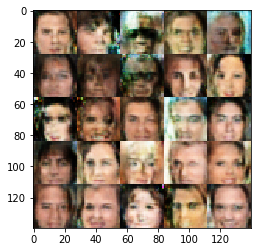

Epoch 1/1 ...  Discriminator loss = 1.058132 Generator loss = 1.142536
Epoch 1/1 ...  Discriminator loss = 1.196066 Generator loss = 0.846016
Epoch 1/1 ...  Discriminator loss = 1.300421 Generator loss = 1.298591
Epoch 1/1 ...  Discriminator loss = 1.137601 Generator loss = 1.400927
Epoch 1/1 ...  Discriminator loss = 1.074356 Generator loss = 1.403878
Epoch 1/1 ...  Discriminator loss = 1.129039 Generator loss = 0.852757
Epoch 1/1 ...  Discriminator loss = 1.065876 Generator loss = 1.295331
Epoch 1/1 ...  Discriminator loss = 1.196346 Generator loss = 0.729562
Epoch 1/1 ...  Discriminator loss = 0.994860 Generator loss = 1.091123
Epoch 1/1 ...  Discriminator loss = 0.924707 Generator loss = 1.207473


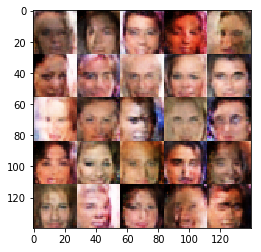

Epoch 1/1 ...  Discriminator loss = 1.514669 Generator loss = 0.788432
Epoch 1/1 ...  Discriminator loss = 1.105935 Generator loss = 1.096179
Epoch 1/1 ...  Discriminator loss = 1.357695 Generator loss = 0.618693
Epoch 1/1 ...  Discriminator loss = 0.968361 Generator loss = 1.256800
Epoch 1/1 ...  Discriminator loss = 1.257251 Generator loss = 0.773934
Epoch 1/1 ...  Discriminator loss = 1.292274 Generator loss = 1.093181
Epoch 1/1 ...  Discriminator loss = 0.942968 Generator loss = 0.915267
Epoch 1/1 ...  Discriminator loss = 1.088173 Generator loss = 1.464943
Epoch 1/1 ...  Discriminator loss = 1.196418 Generator loss = 0.741969
Epoch 1/1 ...  Discriminator loss = 1.231158 Generator loss = 0.907927


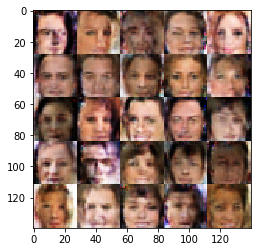

Epoch 1/1 ...  Discriminator loss = 1.291814 Generator loss = 0.872289
Epoch 1/1 ...  Discriminator loss = 0.778769 Generator loss = 1.594647
Epoch 1/1 ...  Discriminator loss = 1.303546 Generator loss = 0.828016
Epoch 1/1 ...  Discriminator loss = 1.319834 Generator loss = 1.293075
Epoch 1/1 ...  Discriminator loss = 1.277907 Generator loss = 0.643631
Epoch 1/1 ...  Discriminator loss = 1.333395 Generator loss = 0.739368
Epoch 1/1 ...  Discriminator loss = 1.312628 Generator loss = 0.973187
Epoch 1/1 ...  Discriminator loss = 1.261420 Generator loss = 0.750303
Epoch 1/1 ...  Discriminator loss = 1.228962 Generator loss = 0.897084
Epoch 1/1 ...  Discriminator loss = 1.367395 Generator loss = 0.592676


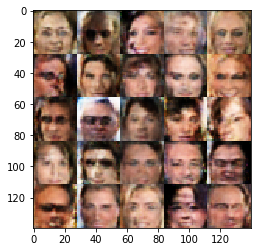

Epoch 1/1 ...  Discriminator loss = 1.144271 Generator loss = 1.229816
Epoch 1/1 ...  Discriminator loss = 0.908758 Generator loss = 1.306238
Epoch 1/1 ...  Discriminator loss = 1.068298 Generator loss = 0.995842
Epoch 1/1 ...  Discriminator loss = 1.511762 Generator loss = 0.590706
Epoch 1/1 ...  Discriminator loss = 1.190357 Generator loss = 0.859779
Epoch 1/1 ...  Discriminator loss = 1.190360 Generator loss = 0.769143
Epoch 1/1 ...  Discriminator loss = 1.191580 Generator loss = 0.890676
Epoch 1/1 ...  Discriminator loss = 1.231837 Generator loss = 0.819035
Epoch 1/1 ...  Discriminator loss = 1.289920 Generator loss = 0.861681
Epoch 1/1 ...  Discriminator loss = 0.965011 Generator loss = 1.124341


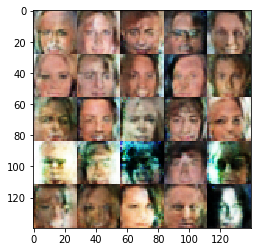

Epoch 1/1 ...  Discriminator loss = 1.249659 Generator loss = 0.773370
Epoch 1/1 ...  Discriminator loss = 1.959862 Generator loss = 0.547400
Epoch 1/1 ...  Discriminator loss = 0.761140 Generator loss = 1.663241
Epoch 1/1 ...  Discriminator loss = 1.117149 Generator loss = 0.665109
Epoch 1/1 ...  Discriminator loss = 1.067818 Generator loss = 0.942617
Epoch 1/1 ...  Discriminator loss = 0.960030 Generator loss = 1.263525
Epoch 1/1 ...  Discriminator loss = 1.128632 Generator loss = 0.756826
Epoch 1/1 ...  Discriminator loss = 1.074026 Generator loss = 0.654576
Epoch 1/1 ...  Discriminator loss = 1.042294 Generator loss = 0.770298
Epoch 1/1 ...  Discriminator loss = 1.269742 Generator loss = 0.851750


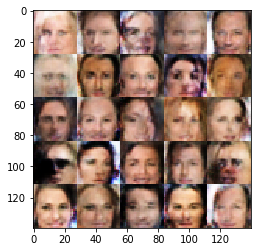

Epoch 1/1 ...  Discriminator loss = 1.214952 Generator loss = 0.735460
Epoch 1/1 ...  Discriminator loss = 0.980733 Generator loss = 0.825648
Epoch 1/1 ...  Discriminator loss = 1.228317 Generator loss = 0.760571
Epoch 1/1 ...  Discriminator loss = 0.987927 Generator loss = 1.213017
Epoch 1/1 ...  Discriminator loss = 1.426415 Generator loss = 0.616468
Epoch 1/1 ...  Discriminator loss = 1.072143 Generator loss = 0.788985
Epoch 1/1 ...  Discriminator loss = 1.143595 Generator loss = 0.910329
Epoch 1/1 ...  Discriminator loss = 1.201921 Generator loss = 0.867044
Epoch 1/1 ...  Discriminator loss = 0.835877 Generator loss = 1.304997
Epoch 1/1 ...  Discriminator loss = 1.608330 Generator loss = 0.659856


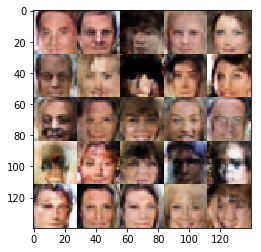

Epoch 1/1 ...  Discriminator loss = 1.176999 Generator loss = 0.876689
Epoch 1/1 ...  Discriminator loss = 1.260477 Generator loss = 0.749875
Epoch 1/1 ...  Discriminator loss = 1.289905 Generator loss = 0.899921
Epoch 1/1 ...  Discriminator loss = 1.108957 Generator loss = 0.737129
Epoch 1/1 ...  Discriminator loss = 0.902218 Generator loss = 1.101156
Epoch 1/1 ...  Discriminator loss = 1.071740 Generator loss = 0.745405
Epoch 1/1 ...  Discriminator loss = 0.998077 Generator loss = 0.986787
Epoch 1/1 ...  Discriminator loss = 1.086565 Generator loss = 0.790248
Epoch 1/1 ...  Discriminator loss = 0.953624 Generator loss = 0.890190
Epoch 1/1 ...  Discriminator loss = 0.873809 Generator loss = 1.088274


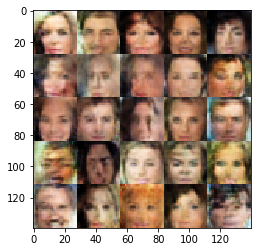

Epoch 1/1 ...  Discriminator loss = 0.932930 Generator loss = 1.160314
Epoch 1/1 ...  Discriminator loss = 1.222284 Generator loss = 0.897086
Epoch 1/1 ...  Discriminator loss = 1.093881 Generator loss = 0.743678
Epoch 1/1 ...  Discriminator loss = 1.187631 Generator loss = 0.810872
Epoch 1/1 ...  Discriminator loss = 1.161672 Generator loss = 1.229866
Epoch 1/1 ...  Discriminator loss = 1.134426 Generator loss = 0.876558
Epoch 1/1 ...  Discriminator loss = 0.879859 Generator loss = 1.149517
Epoch 1/1 ...  Discriminator loss = 1.056129 Generator loss = 0.915301
Epoch 1/1 ...  Discriminator loss = 1.237683 Generator loss = 0.738295
Epoch 1/1 ...  Discriminator loss = 1.215986 Generator loss = 0.973370


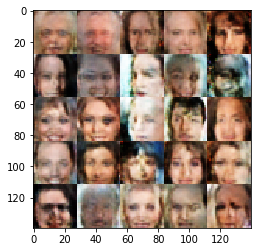

Epoch 1/1 ...  Discriminator loss = 0.911865 Generator loss = 1.267637
Epoch 1/1 ...  Discriminator loss = 1.228538 Generator loss = 0.809991
Epoch 1/1 ...  Discriminator loss = 0.978767 Generator loss = 1.029372
Epoch 1/1 ...  Discriminator loss = 0.869485 Generator loss = 1.160612
Epoch 1/1 ...  Discriminator loss = 1.348055 Generator loss = 0.670505
Epoch 1/1 ...  Discriminator loss = 1.178676 Generator loss = 0.938437
Epoch 1/1 ...  Discriminator loss = 0.820808 Generator loss = 1.212097
Epoch 1/1 ...  Discriminator loss = 1.210182 Generator loss = 1.006225
Epoch 1/1 ...  Discriminator loss = 1.269098 Generator loss = 0.831511
Epoch 1/1 ...  Discriminator loss = 0.832221 Generator loss = 1.156503


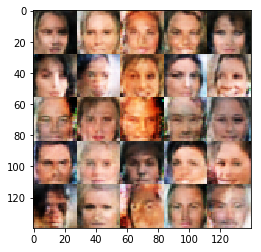

Epoch 1/1 ...  Discriminator loss = 0.904607 Generator loss = 0.884260
Epoch 1/1 ...  Discriminator loss = 1.028225 Generator loss = 0.870126
Epoch 1/1 ...  Discriminator loss = 1.138133 Generator loss = 0.930107
Epoch 1/1 ...  Discriminator loss = 1.107629 Generator loss = 1.066931
Epoch 1/1 ...  Discriminator loss = 1.344662 Generator loss = 0.683305
Epoch 1/1 ...  Discriminator loss = 0.920282 Generator loss = 0.896113
Epoch 1/1 ...  Discriminator loss = 1.476076 Generator loss = 0.733388
Epoch 1/1 ...  Discriminator loss = 0.950406 Generator loss = 1.147247
Epoch 1/1 ...  Discriminator loss = 1.219576 Generator loss = 0.686763
Epoch 1/1 ...  Discriminator loss = 1.358596 Generator loss = 0.808201


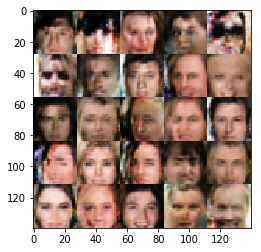

Epoch 1/1 ...  Discriminator loss = 1.513184 Generator loss = 0.764962
Epoch 1/1 ...  Discriminator loss = 1.014367 Generator loss = 0.967642
Epoch 1/1 ...  Discriminator loss = 1.331712 Generator loss = 0.695067
Epoch 1/1 ...  Discriminator loss = 1.406463 Generator loss = 0.509147
Epoch 1/1 ...  Discriminator loss = 0.951332 Generator loss = 1.107712
Epoch 1/1 ...  Discriminator loss = 1.312344 Generator loss = 0.822082
Epoch 1/1 ...  Discriminator loss = 1.183382 Generator loss = 0.755973
Epoch 1/1 ...  Discriminator loss = 1.167933 Generator loss = 0.708739
Epoch 1/1 ...  Discriminator loss = 1.226152 Generator loss = 0.764655
Epoch 1/1 ...  Discriminator loss = 1.151298 Generator loss = 1.257992


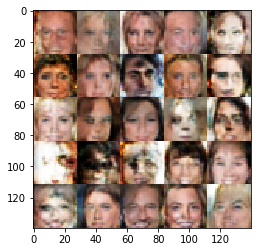

Epoch 1/1 ...  Discriminator loss = 0.920859 Generator loss = 0.973425
Epoch 1/1 ...  Discriminator loss = 1.111730 Generator loss = 1.009802
Epoch 1/1 ...  Discriminator loss = 1.167663 Generator loss = 0.862236
Epoch 1/1 ...  Discriminator loss = 1.265777 Generator loss = 1.235963
Epoch 1/1 ...  Discriminator loss = 1.218078 Generator loss = 0.824198
Epoch 1/1 ...  Discriminator loss = 1.133484 Generator loss = 0.959035
Epoch 1/1 ...  Discriminator loss = 1.114777 Generator loss = 1.283213
Epoch 1/1 ...  Discriminator loss = 1.289099 Generator loss = 0.813949
Epoch 1/1 ...  Discriminator loss = 1.345538 Generator loss = 1.141534
Epoch 1/1 ...  Discriminator loss = 0.973595 Generator loss = 1.116580


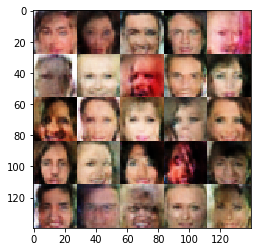

Epoch 1/1 ...  Discriminator loss = 1.285057 Generator loss = 0.621580
Epoch 1/1 ...  Discriminator loss = 1.112324 Generator loss = 0.865526
Epoch 1/1 ...  Discriminator loss = 1.305470 Generator loss = 0.922797
Epoch 1/1 ...  Discriminator loss = 1.053988 Generator loss = 0.942672
Epoch 1/1 ...  Discriminator loss = 1.330443 Generator loss = 0.760435
Epoch 1/1 ...  Discriminator loss = 1.264342 Generator loss = 0.636579
Epoch 1/1 ...  Discriminator loss = 1.112960 Generator loss = 1.024105
Epoch 1/1 ...  Discriminator loss = 1.058722 Generator loss = 0.839325
Epoch 1/1 ...  Discriminator loss = 1.596542 Generator loss = 0.646560
Epoch 1/1 ...  Discriminator loss = 1.371532 Generator loss = 0.919751


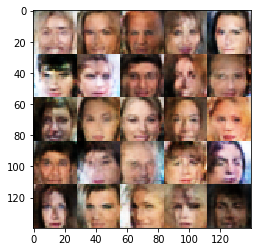

Epoch 1/1 ...  Discriminator loss = 1.140522 Generator loss = 0.920323
Epoch 1/1 ...  Discriminator loss = 1.112810 Generator loss = 1.083392
Epoch 1/1 ...  Discriminator loss = 1.118132 Generator loss = 0.916254
Epoch 1/1 ...  Discriminator loss = 1.340687 Generator loss = 0.813085
Epoch 1/1 ...  Discriminator loss = 1.282478 Generator loss = 0.633874
Epoch 1/1 ...  Discriminator loss = 1.632241 Generator loss = 0.714026
Epoch 1/1 ...  Discriminator loss = 1.350474 Generator loss = 0.740615
Epoch 1/1 ...  Discriminator loss = 1.327109 Generator loss = 0.600186
Epoch 1/1 ...  Discriminator loss = 1.468062 Generator loss = 0.793757
Epoch 1/1 ...  Discriminator loss = 1.146443 Generator loss = 0.803480


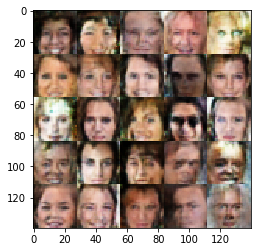

Epoch 1/1 ...  Discriminator loss = 1.525245 Generator loss = 0.659951
Epoch 1/1 ...  Discriminator loss = 1.496260 Generator loss = 0.493832
Epoch 1/1 ...  Discriminator loss = 1.107158 Generator loss = 1.110951
Epoch 1/1 ...  Discriminator loss = 1.065935 Generator loss = 0.791813
Epoch 1/1 ...  Discriminator loss = 1.143256 Generator loss = 0.830923
Epoch 1/1 ...  Discriminator loss = 1.101965 Generator loss = 1.007372
Epoch 1/1 ...  Discriminator loss = 1.231656 Generator loss = 0.827472
Epoch 1/1 ...  Discriminator loss = 1.134470 Generator loss = 0.973363
Epoch 1/1 ...  Discriminator loss = 1.382492 Generator loss = 0.633535
Epoch 1/1 ...  Discriminator loss = 1.092294 Generator loss = 0.783665


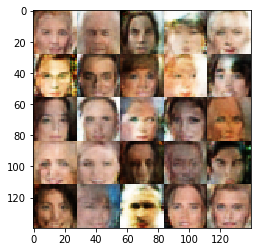

Epoch 1/1 ...  Discriminator loss = 1.254259 Generator loss = 0.938947
Epoch 1/1 ...  Discriminator loss = 1.117261 Generator loss = 1.080783
Epoch 1/1 ...  Discriminator loss = 1.256954 Generator loss = 0.998970
Epoch 1/1 ...  Discriminator loss = 0.997940 Generator loss = 1.036659
Epoch 1/1 ...  Discriminator loss = 1.177971 Generator loss = 0.998828
Epoch 1/1 ...  Discriminator loss = 1.304562 Generator loss = 0.713935
Epoch 1/1 ...  Discriminator loss = 1.072654 Generator loss = 0.830471
Epoch 1/1 ...  Discriminator loss = 1.525226 Generator loss = 0.703321
Epoch 1/1 ...  Discriminator loss = 1.225307 Generator loss = 0.784403
Epoch 1/1 ...  Discriminator loss = 1.315498 Generator loss = 0.686390


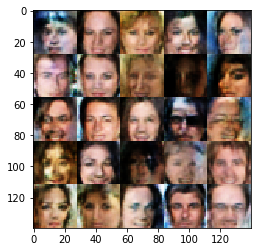

Epoch 1/1 ...  Discriminator loss = 1.235401 Generator loss = 0.685453
Epoch 1/1 ...  Discriminator loss = 1.131045 Generator loss = 0.801903
Epoch 1/1 ...  Discriminator loss = 1.055168 Generator loss = 0.786114
Epoch 1/1 ...  Discriminator loss = 1.043848 Generator loss = 0.972905
Epoch 1/1 ...  Discriminator loss = 0.967409 Generator loss = 1.294978
Epoch 1/1 ...  Discriminator loss = 1.167630 Generator loss = 0.835758
Epoch 1/1 ...  Discriminator loss = 1.256209 Generator loss = 0.764928
Epoch 1/1 ...  Discriminator loss = 1.200865 Generator loss = 0.923258
Epoch 1/1 ...  Discriminator loss = 1.263105 Generator loss = 0.773363
Epoch 1/1 ...  Discriminator loss = 1.186868 Generator loss = 0.940597


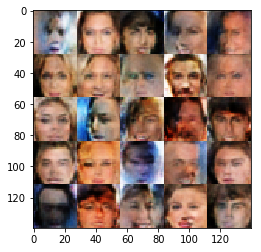

Epoch 1/1 ...  Discriminator loss = 0.797857 Generator loss = 1.368605
Epoch 1/1 ...  Discriminator loss = 1.241423 Generator loss = 0.799061
Epoch 1/1 ...  Discriminator loss = 1.379320 Generator loss = 0.622504
Epoch 1/1 ...  Discriminator loss = 1.669548 Generator loss = 0.674394
Epoch 1/1 ...  Discriminator loss = 1.079749 Generator loss = 0.910318
Epoch 1/1 ...  Discriminator loss = 1.502589 Generator loss = 0.756559
Epoch 1/1 ...  Discriminator loss = 1.162705 Generator loss = 0.800804
Epoch 1/1 ...  Discriminator loss = 0.974170 Generator loss = 1.121300
Epoch 1/1 ...  Discriminator loss = 1.255544 Generator loss = 0.925883
Epoch 1/1 ...  Discriminator loss = 1.381143 Generator loss = 0.837686


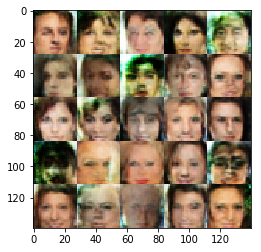

Epoch 1/1 ...  Discriminator loss = 1.361778 Generator loss = 0.714763
Epoch 1/1 ...  Discriminator loss = 0.927195 Generator loss = 1.075698
Epoch 1/1 ...  Discriminator loss = 0.888258 Generator loss = 0.982044
Epoch 1/1 ...  Discriminator loss = 0.841495 Generator loss = 1.333537
Epoch 1/1 ...  Discriminator loss = 1.427630 Generator loss = 0.518894
Epoch 1/1 ...  Discriminator loss = 0.868021 Generator loss = 1.046462
Epoch 1/1 ...  Discriminator loss = 1.106669 Generator loss = 0.912699
Epoch 1/1 ...  Discriminator loss = 1.363070 Generator loss = 0.854747
Epoch 1/1 ...  Discriminator loss = 1.247938 Generator loss = 0.999214
Epoch 1/1 ...  Discriminator loss = 1.036731 Generator loss = 1.161232


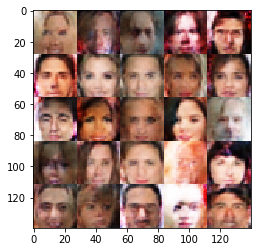

Epoch 1/1 ...  Discriminator loss = 1.533221 Generator loss = 0.660571
Epoch 1/1 ...  Discriminator loss = 1.730899 Generator loss = 0.459034
Epoch 1/1 ...  Discriminator loss = 1.989500 Generator loss = 0.579356
Epoch 1/1 ...  Discriminator loss = 1.028080 Generator loss = 1.031247
Epoch 1/1 ...  Discriminator loss = 1.313700 Generator loss = 0.839856
Epoch 1/1 ...  Discriminator loss = 1.182231 Generator loss = 0.760827
Epoch 1/1 ...  Discriminator loss = 0.974859 Generator loss = 1.102078
Epoch 1/1 ...  Discriminator loss = 1.169408 Generator loss = 0.664795
Epoch 1/1 ...  Discriminator loss = 1.549992 Generator loss = 0.541607
Epoch 1/1 ...  Discriminator loss = 1.119288 Generator loss = 0.848073


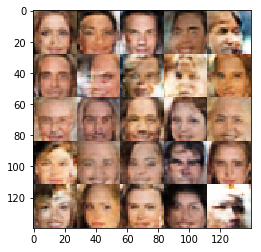

Epoch 1/1 ...  Discriminator loss = 1.359899 Generator loss = 0.942457
Epoch 1/1 ...  Discriminator loss = 1.386016 Generator loss = 0.814526
Epoch 1/1 ...  Discriminator loss = 0.881993 Generator loss = 1.384259
Epoch 1/1 ...  Discriminator loss = 1.483333 Generator loss = 1.021688
Epoch 1/1 ...  Discriminator loss = 1.368737 Generator loss = 0.844678
Epoch 1/1 ...  Discriminator loss = 1.260273 Generator loss = 0.680220
Epoch 1/1 ...  Discriminator loss = 1.204190 Generator loss = 0.592626
Epoch 1/1 ...  Discriminator loss = 0.989347 Generator loss = 1.047622
Epoch 1/1 ...  Discriminator loss = 1.103101 Generator loss = 1.017923
Epoch 1/1 ...  Discriminator loss = 1.159407 Generator loss = 0.704988


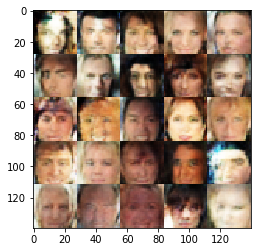

Epoch 1/1 ...  Discriminator loss = 1.171066 Generator loss = 1.085061
Epoch 1/1 ...  Discriminator loss = 1.432663 Generator loss = 0.823790
Epoch 1/1 ...  Discriminator loss = 1.230159 Generator loss = 0.673010
Epoch 1/1 ...  Discriminator loss = 0.840993 Generator loss = 1.543615
Epoch 1/1 ...  Discriminator loss = 1.037021 Generator loss = 1.221908
Epoch 1/1 ...  Discriminator loss = 1.351722 Generator loss = 0.686969
Epoch 1/1 ...  Discriminator loss = 1.181672 Generator loss = 0.779797
Epoch 1/1 ...  Discriminator loss = 1.117464 Generator loss = 1.272936
Epoch 1/1 ...  Discriminator loss = 1.345408 Generator loss = 0.739208
Epoch 1/1 ...  Discriminator loss = 1.360821 Generator loss = 0.636538


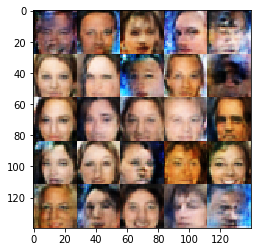

Epoch 1/1 ...  Discriminator loss = 1.046551 Generator loss = 0.932158
Epoch 1/1 ...  Discriminator loss = 1.440262 Generator loss = 0.766291
Epoch 1/1 ...  Discriminator loss = 0.944020 Generator loss = 1.103783
Epoch 1/1 ...  Discriminator loss = 1.114818 Generator loss = 1.067950
Epoch 1/1 ...  Discriminator loss = 1.258690 Generator loss = 0.865568
Epoch 1/1 ...  Discriminator loss = 1.243051 Generator loss = 0.654850
Epoch 1/1 ...  Discriminator loss = 1.617173 Generator loss = 0.602887
Epoch 1/1 ...  Discriminator loss = 1.167586 Generator loss = 0.817620
Epoch 1/1 ...  Discriminator loss = 1.375713 Generator loss = 0.510600
Epoch 1/1 ...  Discriminator loss = 1.176800 Generator loss = 0.820905


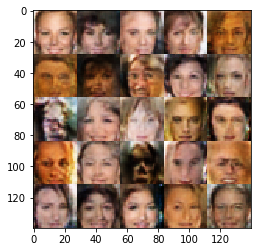

Epoch 1/1 ...  Discriminator loss = 1.004142 Generator loss = 1.046618
Epoch 1/1 ...  Discriminator loss = 0.918468 Generator loss = 1.047377
Epoch 1/1 ...  Discriminator loss = 1.343122 Generator loss = 0.684411
Epoch 1/1 ...  Discriminator loss = 1.080376 Generator loss = 1.156466
Epoch 1/1 ...  Discriminator loss = 0.899695 Generator loss = 0.962045
Epoch 1/1 ...  Discriminator loss = 1.011012 Generator loss = 0.822003
Epoch 1/1 ...  Discriminator loss = 0.968229 Generator loss = 0.798660
Epoch 1/1 ...  Discriminator loss = 1.126865 Generator loss = 1.111028
Epoch 1/1 ...  Discriminator loss = 1.070053 Generator loss = 1.045761
Epoch 1/1 ...  Discriminator loss = 1.094985 Generator loss = 0.923125


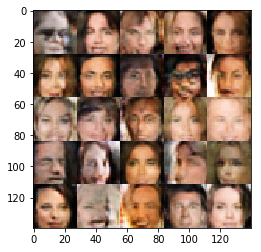

Epoch 1/1 ...  Discriminator loss = 0.658617 Generator loss = 1.226600
Epoch 1/1 ...  Discriminator loss = 1.231706 Generator loss = 0.729710
Epoch 1/1 ...  Discriminator loss = 1.560179 Generator loss = 0.587494
Epoch 1/1 ...  Discriminator loss = 1.493577 Generator loss = 0.560217
Epoch 1/1 ...  Discriminator loss = 1.116126 Generator loss = 0.826016
Epoch 1/1 ...  Discriminator loss = 0.951219 Generator loss = 0.825264
Epoch 1/1 ...  Discriminator loss = 1.560313 Generator loss = 0.562130
Epoch 1/1 ...  Discriminator loss = 1.668020 Generator loss = 0.520639
Epoch 1/1 ...  Discriminator loss = 1.124835 Generator loss = 1.049432
Epoch 1/1 ...  Discriminator loss = 1.412521 Generator loss = 0.552152


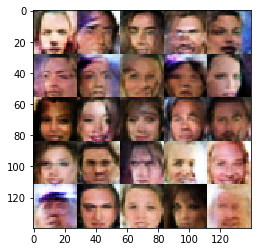

Epoch 1/1 ...  Discriminator loss = 1.454114 Generator loss = 0.525680
Epoch 1/1 ...  Discriminator loss = 1.211437 Generator loss = 0.659376
Epoch 1/1 ...  Discriminator loss = 1.123410 Generator loss = 0.820577
Epoch 1/1 ...  Discriminator loss = 1.282809 Generator loss = 1.008100
Epoch 1/1 ...  Discriminator loss = 1.023653 Generator loss = 1.080916
Epoch 1/1 ...  Discriminator loss = 1.262573 Generator loss = 0.900904
Epoch 1/1 ...  Discriminator loss = 1.236094 Generator loss = 0.828532
Epoch 1/1 ...  Discriminator loss = 1.073894 Generator loss = 0.903506
Epoch 1/1 ...  Discriminator loss = 1.090589 Generator loss = 0.938925
Epoch 1/1 ...  Discriminator loss = 0.878864 Generator loss = 1.567812


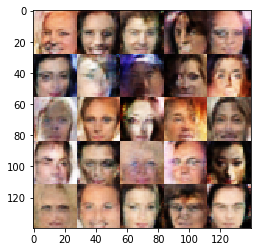

Epoch 1/1 ...  Discriminator loss = 1.184681 Generator loss = 0.856437
Epoch 1/1 ...  Discriminator loss = 1.618679 Generator loss = 0.695588
Epoch 1/1 ...  Discriminator loss = 1.270155 Generator loss = 0.904850
Epoch 1/1 ...  Discriminator loss = 1.037516 Generator loss = 1.136270
Epoch 1/1 ...  Discriminator loss = 1.092907 Generator loss = 1.007804
Epoch 1/1 ...  Discriminator loss = 1.280304 Generator loss = 1.327371
Epoch 1/1 ...  Discriminator loss = 0.984598 Generator loss = 1.105785
Epoch 1/1 ...  Discriminator loss = 1.081179 Generator loss = 0.845900
Epoch 1/1 ...  Discriminator loss = 0.919122 Generator loss = 1.147851
Epoch 1/1 ...  Discriminator loss = 1.506123 Generator loss = 0.605633


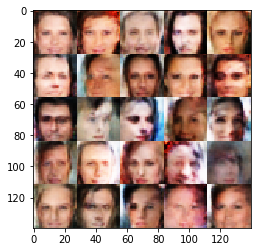

Epoch 1/1 ...  Discriminator loss = 1.460078 Generator loss = 0.547199
Epoch 1/1 ...  Discriminator loss = 1.187969 Generator loss = 0.851815
Epoch 1/1 ...  Discriminator loss = 0.807298 Generator loss = 1.414940
Epoch 1/1 ...  Discriminator loss = 1.224853 Generator loss = 0.603257
Epoch 1/1 ...  Discriminator loss = 1.123762 Generator loss = 0.820052
Epoch 1/1 ...  Discriminator loss = 1.172157 Generator loss = 0.860922
Epoch 1/1 ...  Discriminator loss = 1.187977 Generator loss = 0.822678
Epoch 1/1 ...  Discriminator loss = 1.229445 Generator loss = 1.224708
Epoch 1/1 ...  Discriminator loss = 1.112494 Generator loss = 0.862871
Epoch 1/1 ...  Discriminator loss = 1.169810 Generator loss = 0.908557


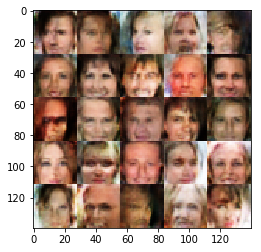

Epoch 1/1 ...  Discriminator loss = 0.860057 Generator loss = 1.196277
Epoch 1/1 ...  Discriminator loss = 0.792511 Generator loss = 1.241827
Epoch 1/1 ...  Discriminator loss = 1.398090 Generator loss = 0.659846
Epoch 1/1 ...  Discriminator loss = 1.449479 Generator loss = 0.610184
Epoch 1/1 ...  Discriminator loss = 1.148152 Generator loss = 1.278495
Epoch 1/1 ...  Discriminator loss = 0.899687 Generator loss = 0.932439
Epoch 1/1 ...  Discriminator loss = 1.103245 Generator loss = 0.922525
Epoch 1/1 ...  Discriminator loss = 0.762702 Generator loss = 1.449218
Epoch 1/1 ...  Discriminator loss = 1.235578 Generator loss = 0.765905
Epoch 1/1 ...  Discriminator loss = 1.089415 Generator loss = 1.098639


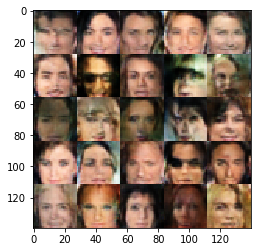

Epoch 1/1 ...  Discriminator loss = 1.285909 Generator loss = 1.071379
Epoch 1/1 ...  Discriminator loss = 1.662911 Generator loss = 0.439933
Epoch 1/1 ...  Discriminator loss = 1.375976 Generator loss = 1.028415
Epoch 1/1 ...  Discriminator loss = 1.504505 Generator loss = 0.770198
Epoch 1/1 ...  Discriminator loss = 1.135791 Generator loss = 0.669288
Epoch 1/1 ...  Discriminator loss = 1.160892 Generator loss = 0.988254
Epoch 1/1 ...  Discriminator loss = 1.175638 Generator loss = 0.697221
Epoch 1/1 ...  Discriminator loss = 1.195500 Generator loss = 0.647558
Epoch 1/1 ...  Discriminator loss = 0.858288 Generator loss = 0.980978
Epoch 1/1 ...  Discriminator loss = 1.226970 Generator loss = 0.701252


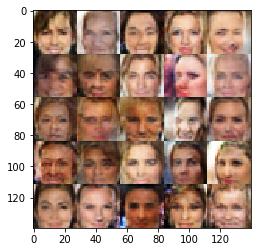

Epoch 1/1 ...  Discriminator loss = 1.234111 Generator loss = 1.216191
Epoch 1/1 ...  Discriminator loss = 1.120523 Generator loss = 0.777197
Epoch 1/1 ...  Discriminator loss = 1.240915 Generator loss = 1.118668
Epoch 1/1 ...  Discriminator loss = 1.060585 Generator loss = 0.902602
Epoch 1/1 ...  Discriminator loss = 1.050878 Generator loss = 0.806997
Epoch 1/1 ...  Discriminator loss = 0.996702 Generator loss = 1.327054
Epoch 1/1 ...  Discriminator loss = 1.134004 Generator loss = 0.814028
Epoch 1/1 ...  Discriminator loss = 1.482377 Generator loss = 0.517195
Epoch 1/1 ...  Discriminator loss = 1.164651 Generator loss = 0.728767
Epoch 1/1 ...  Discriminator loss = 1.134229 Generator loss = 1.048803


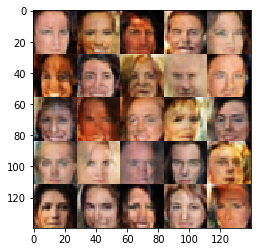

Epoch 1/1 ...  Discriminator loss = 1.448039 Generator loss = 0.703817
Epoch 1/1 ...  Discriminator loss = 1.243828 Generator loss = 0.803642
Epoch 1/1 ...  Discriminator loss = 0.952969 Generator loss = 1.243949
Epoch 1/1 ...  Discriminator loss = 1.125269 Generator loss = 1.049693
Epoch 1/1 ...  Discriminator loss = 1.206178 Generator loss = 1.102608
Epoch 1/1 ...  Discriminator loss = 1.086944 Generator loss = 1.107857
Epoch 1/1 ...  Discriminator loss = 1.222574 Generator loss = 1.184661
Epoch 1/1 ...  Discriminator loss = 1.117694 Generator loss = 1.222431
Epoch 1/1 ...  Discriminator loss = 1.070331 Generator loss = 0.988801
Epoch 1/1 ...  Discriminator loss = 1.166921 Generator loss = 0.806077


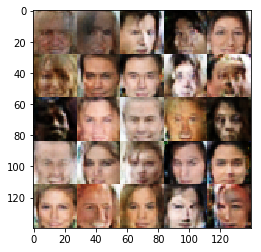

Epoch 1/1 ...  Discriminator loss = 1.134406 Generator loss = 0.765461
Epoch 1/1 ...  Discriminator loss = 1.447124 Generator loss = 0.816876
Epoch 1/1 ...  Discriminator loss = 1.318982 Generator loss = 0.828268
Epoch 1/1 ...  Discriminator loss = 1.269700 Generator loss = 0.789442
Epoch 1/1 ...  Discriminator loss = 1.204150 Generator loss = 0.617286
Epoch 1/1 ...  Discriminator loss = 1.079392 Generator loss = 1.258396
Epoch 1/1 ...  Discriminator loss = 1.371236 Generator loss = 1.034039
Epoch 1/1 ...  Discriminator loss = 0.961193 Generator loss = 1.088370
Epoch 1/1 ...  Discriminator loss = 1.398614 Generator loss = 0.680722
Epoch 1/1 ...  Discriminator loss = 1.145478 Generator loss = 0.890390


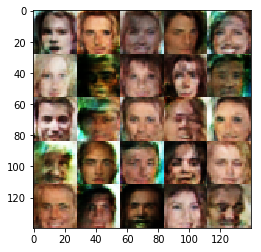

Epoch 1/1 ...  Discriminator loss = 1.659874 Generator loss = 0.794429
Epoch 1/1 ...  Discriminator loss = 1.086499 Generator loss = 1.111856
Epoch 1/1 ...  Discriminator loss = 1.440399 Generator loss = 0.619656
Epoch 1/1 ...  Discriminator loss = 1.144865 Generator loss = 1.027641
Epoch 1/1 ...  Discriminator loss = 2.219620 Generator loss = 0.376008
Epoch 1/1 ...  Discriminator loss = 0.984506 Generator loss = 0.785237
Epoch 1/1 ...  Discriminator loss = 1.580362 Generator loss = 0.523404
Epoch 1/1 ...  Discriminator loss = 1.110591 Generator loss = 0.763813
Epoch 1/1 ...  Discriminator loss = 0.985625 Generator loss = 0.923275
Epoch 1/1 ...  Discriminator loss = 1.081472 Generator loss = 0.930750


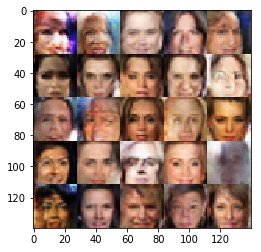

Epoch 1/1 ...  Discriminator loss = 1.093517 Generator loss = 1.242074
Epoch 1/1 ...  Discriminator loss = 1.366196 Generator loss = 0.817759
Epoch 1/1 ...  Discriminator loss = 1.155214 Generator loss = 0.751277
Epoch 1/1 ...  Discriminator loss = 1.160515 Generator loss = 0.687653
Epoch 1/1 ...  Discriminator loss = 1.092214 Generator loss = 1.187904
Epoch 1/1 ...  Discriminator loss = 1.789268 Generator loss = 0.457496
Epoch 1/1 ...  Discriminator loss = 1.360999 Generator loss = 0.762779
Epoch 1/1 ...  Discriminator loss = 1.380790 Generator loss = 0.816682
Epoch 1/1 ...  Discriminator loss = 1.091294 Generator loss = 0.864825
Epoch 1/1 ...  Discriminator loss = 1.036264 Generator loss = 0.719086


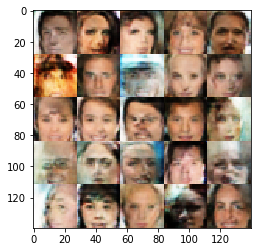

Epoch 1/1 ...  Discriminator loss = 1.086056 Generator loss = 0.755799
Epoch 1/1 ...  Discriminator loss = 1.473144 Generator loss = 0.654748
Epoch 1/1 ...  Discriminator loss = 1.255871 Generator loss = 1.009149
Epoch 1/1 ...  Discriminator loss = 1.309494 Generator loss = 0.828527
Epoch 1/1 ...  Discriminator loss = 1.101404 Generator loss = 0.877255
Epoch 1/1 ...  Discriminator loss = 0.820636 Generator loss = 1.378002
Epoch 1/1 ...  Discriminator loss = 1.362368 Generator loss = 0.688172
Epoch 1/1 ...  Discriminator loss = 1.185703 Generator loss = 0.685933
Epoch 1/1 ...  Discriminator loss = 1.075494 Generator loss = 0.990095
Epoch 1/1 ...  Discriminator loss = 1.383010 Generator loss = 1.168600


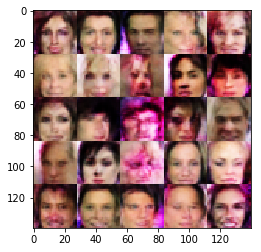

Epoch 1/1 ...  Discriminator loss = 1.191363 Generator loss = 0.750714
Epoch 1/1 ...  Discriminator loss = 1.510854 Generator loss = 0.643322
Epoch 1/1 ...  Discriminator loss = 1.269039 Generator loss = 0.722257
Epoch 1/1 ...  Discriminator loss = 1.248928 Generator loss = 0.738933
Epoch 1/1 ...  Discriminator loss = 1.180575 Generator loss = 1.444347
Epoch 1/1 ...  Discriminator loss = 1.550263 Generator loss = 0.693423
Epoch 1/1 ...  Discriminator loss = 1.314587 Generator loss = 0.775587
Epoch 1/1 ...  Discriminator loss = 1.002991 Generator loss = 1.052117
Epoch 1/1 ...  Discriminator loss = 0.915396 Generator loss = 0.865270
Epoch 1/1 ...  Discriminator loss = 1.063426 Generator loss = 0.792796


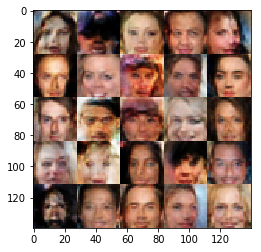

Epoch 1/1 ...  Discriminator loss = 1.158615 Generator loss = 0.896604
Epoch 1/1 ...  Discriminator loss = 1.432727 Generator loss = 0.981534
Epoch 1/1 ...  Discriminator loss = 1.293384 Generator loss = 0.820186
Epoch 1/1 ...  Discriminator loss = 1.144754 Generator loss = 0.780976
Epoch 1/1 ...  Discriminator loss = 0.966894 Generator loss = 0.997083
Epoch 1/1 ...  Discriminator loss = 1.202391 Generator loss = 0.761717
Epoch 1/1 ...  Discriminator loss = 1.223237 Generator loss = 0.734103
Epoch 1/1 ...  Discriminator loss = 0.925101 Generator loss = 0.965561
Epoch 1/1 ...  Discriminator loss = 1.296166 Generator loss = 0.728189
Epoch 1/1 ...  Discriminator loss = 0.833279 Generator loss = 0.862394


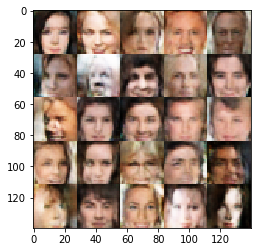

Epoch 1/1 ...  Discriminator loss = 1.013391 Generator loss = 1.035968
Epoch 1/1 ...  Discriminator loss = 1.075499 Generator loss = 0.960109
Epoch 1/1 ...  Discriminator loss = 1.415646 Generator loss = 0.723022
Epoch 1/1 ...  Discriminator loss = 1.298269 Generator loss = 0.609636
Epoch 1/1 ...  Discriminator loss = 0.822051 Generator loss = 1.119217
Epoch 1/1 ...  Discriminator loss = 1.182264 Generator loss = 0.800941
Epoch 1/1 ...  Discriminator loss = 1.314458 Generator loss = 0.688506
Epoch 1/1 ...  Discriminator loss = 0.988870 Generator loss = 1.132264
Epoch 1/1 ...  Discriminator loss = 1.191986 Generator loss = 0.891940
Epoch 1/1 ...  Discriminator loss = 0.971149 Generator loss = 0.924771


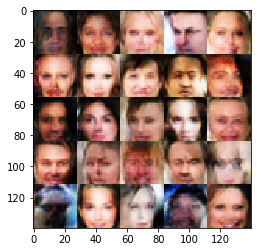

Epoch 1/1 ...  Discriminator loss = 0.978976 Generator loss = 0.819976
Epoch 1/1 ...  Discriminator loss = 1.164000 Generator loss = 0.692713
Epoch 1/1 ...  Discriminator loss = 0.631208 Generator loss = 1.450602
Epoch 1/1 ...  Discriminator loss = 1.192773 Generator loss = 0.745809
Epoch 1/1 ...  Discriminator loss = 1.188264 Generator loss = 0.796994
Epoch 1/1 ...  Discriminator loss = 1.258044 Generator loss = 0.733263
Epoch 1/1 ...  Discriminator loss = 0.756391 Generator loss = 1.453224
Epoch 1/1 ...  Discriminator loss = 1.022675 Generator loss = 1.437074
Epoch 1/1 ...  Discriminator loss = 1.267524 Generator loss = 0.954316
Epoch 1/1 ...  Discriminator loss = 0.998486 Generator loss = 1.286747


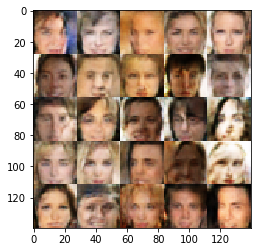

Epoch 1/1 ...  Discriminator loss = 1.369438 Generator loss = 0.572485
Epoch 1/1 ...  Discriminator loss = 1.212168 Generator loss = 0.693596
Epoch 1/1 ...  Discriminator loss = 0.993800 Generator loss = 1.122298
Epoch 1/1 ...  Discriminator loss = 1.050740 Generator loss = 0.825490
Epoch 1/1 ...  Discriminator loss = 1.004482 Generator loss = 1.236339
Epoch 1/1 ...  Discriminator loss = 1.262543 Generator loss = 0.796447
Epoch 1/1 ...  Discriminator loss = 1.291123 Generator loss = 0.770888
Epoch 1/1 ...  Discriminator loss = 1.128679 Generator loss = 1.032135
Epoch 1/1 ...  Discriminator loss = 1.511841 Generator loss = 0.709161
Epoch 1/1 ...  Discriminator loss = 1.174559 Generator loss = 0.912032


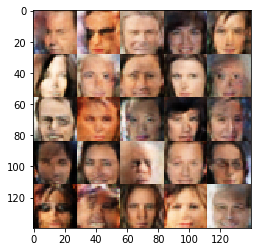

Epoch 1/1 ...  Discriminator loss = 1.157960 Generator loss = 0.972673
Epoch 1/1 ...  Discriminator loss = 0.911209 Generator loss = 1.172699
Epoch 1/1 ...  Discriminator loss = 1.018049 Generator loss = 0.951513
Epoch 1/1 ...  Discriminator loss = 1.800142 Generator loss = 0.596501
Epoch 1/1 ...  Discriminator loss = 1.182907 Generator loss = 0.754112
Epoch 1/1 ...  Discriminator loss = 1.174573 Generator loss = 0.958951
Epoch 1/1 ...  Discriminator loss = 1.152317 Generator loss = 1.027211
Epoch 1/1 ...  Discriminator loss = 0.970674 Generator loss = 1.222786
Epoch 1/1 ...  Discriminator loss = 1.427965 Generator loss = 1.039821
Epoch 1/1 ...  Discriminator loss = 0.975173 Generator loss = 0.908808


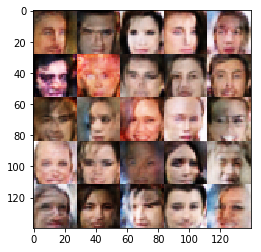

Epoch 1/1 ...  Discriminator loss = 1.238256 Generator loss = 0.981002
Epoch 1/1 ...  Discriminator loss = 1.141016 Generator loss = 0.920712
Epoch 1/1 ...  Discriminator loss = 1.381270 Generator loss = 0.529858
Epoch 1/1 ...  Discriminator loss = 0.814728 Generator loss = 1.180943
Epoch 1/1 ...  Discriminator loss = 1.061381 Generator loss = 1.137081
Epoch 1/1 ...  Discriminator loss = 0.986674 Generator loss = 0.935428
Epoch 1/1 ...  Discriminator loss = 0.969070 Generator loss = 0.860938
Epoch 1/1 ...  Discriminator loss = 0.916448 Generator loss = 1.033629
Epoch 1/1 ...  Discriminator loss = 1.005802 Generator loss = 0.817628
Epoch 1/1 ...  Discriminator loss = 0.966558 Generator loss = 1.130357


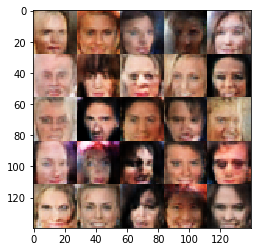

Epoch 1/1 ...  Discriminator loss = 1.233377 Generator loss = 0.845504
Epoch 1/1 ...  Discriminator loss = 1.231489 Generator loss = 0.660483
Epoch 1/1 ...  Discriminator loss = 0.997568 Generator loss = 1.047610
Epoch 1/1 ...  Discriminator loss = 1.150994 Generator loss = 1.010802
Epoch 1/1 ...  Discriminator loss = 1.195887 Generator loss = 0.757241
Epoch 1/1 ...  Discriminator loss = 1.303839 Generator loss = 0.845797
Epoch 1/1 ...  Discriminator loss = 0.908301 Generator loss = 1.410584
Epoch 1/1 ...  Discriminator loss = 0.921503 Generator loss = 1.451270
Epoch 1/1 ...  Discriminator loss = 0.999358 Generator loss = 0.871462
Epoch 1/1 ...  Discriminator loss = 0.900249 Generator loss = 1.194320


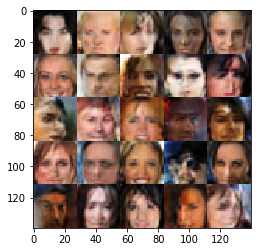

Epoch 1/1 ...  Discriminator loss = 1.043020 Generator loss = 0.906139
Epoch 1/1 ...  Discriminator loss = 1.054672 Generator loss = 1.193535
Epoch 1/1 ...  Discriminator loss = 1.125907 Generator loss = 0.820036
Epoch 1/1 ...  Discriminator loss = 1.696593 Generator loss = 0.572537
Epoch 1/1 ...  Discriminator loss = 1.068581 Generator loss = 1.083626
Epoch 1/1 ...  Discriminator loss = 0.701788 Generator loss = 1.248827
Epoch 1/1 ...  Discriminator loss = 1.286856 Generator loss = 0.946488
Epoch 1/1 ...  Discriminator loss = 0.961600 Generator loss = 0.958287
Epoch 1/1 ...  Discriminator loss = 0.934363 Generator loss = 1.183010
Epoch 1/1 ...  Discriminator loss = 1.191060 Generator loss = 0.957670


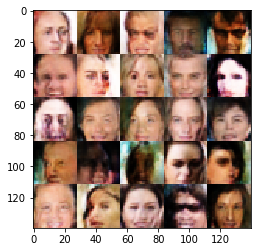

Epoch 1/1 ...  Discriminator loss = 0.979135 Generator loss = 0.978681
Epoch 1/1 ...  Discriminator loss = 1.123058 Generator loss = 0.802579
Epoch 1/1 ...  Discriminator loss = 1.113166 Generator loss = 1.169448
Epoch 1/1 ...  Discriminator loss = 1.429098 Generator loss = 0.587785
Epoch 1/1 ...  Discriminator loss = 0.804220 Generator loss = 1.060801
Epoch 1/1 ...  Discriminator loss = 1.299458 Generator loss = 0.969109
Epoch 1/1 ...  Discriminator loss = 1.127885 Generator loss = 1.102031
Epoch 1/1 ...  Discriminator loss = 0.959982 Generator loss = 0.975133
Epoch 1/1 ...  Discriminator loss = 1.274283 Generator loss = 0.656291
Epoch 1/1 ...  Discriminator loss = 1.018764 Generator loss = 1.161795


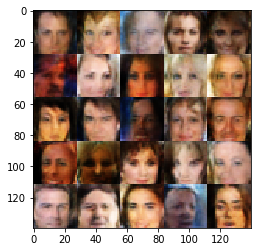

Epoch 1/1 ...  Discriminator loss = 1.480335 Generator loss = 0.659365
Epoch 1/1 ...  Discriminator loss = 1.336482 Generator loss = 0.723727
Epoch 1/1 ...  Discriminator loss = 1.178198 Generator loss = 0.785703
Epoch 1/1 ...  Discriminator loss = 1.289418 Generator loss = 0.759045
Epoch 1/1 ...  Discriminator loss = 1.389941 Generator loss = 0.633092
Epoch 1/1 ...  Discriminator loss = 0.923350 Generator loss = 1.221196
Epoch 1/1 ...  Discriminator loss = 1.134353 Generator loss = 0.976603
Epoch 1/1 ...  Discriminator loss = 1.463242 Generator loss = 0.675393
Epoch 1/1 ...  Discriminator loss = 0.885207 Generator loss = 1.173594
Epoch 1/1 ...  Discriminator loss = 1.365330 Generator loss = 0.922063


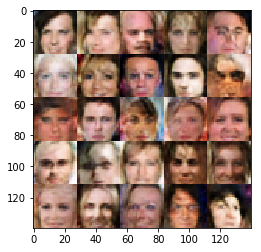

Epoch 1/1 ...  Discriminator loss = 1.098135 Generator loss = 0.977598
Epoch 1/1 ...  Discriminator loss = 1.052410 Generator loss = 1.390764
Epoch 1/1 ...  Discriminator loss = 1.761174 Generator loss = 0.723436
Epoch 1/1 ...  Discriminator loss = 0.988009 Generator loss = 0.880020
Epoch 1/1 ...  Discriminator loss = 1.344300 Generator loss = 0.805958
Epoch 1/1 ...  Discriminator loss = 1.243015 Generator loss = 0.710076
Epoch 1/1 ...  Discriminator loss = 1.239936 Generator loss = 0.676844
Epoch 1/1 ...  Discriminator loss = 1.148436 Generator loss = 1.161381
Epoch 1/1 ...  Discriminator loss = 1.780183 Generator loss = 0.451416
Epoch 1/1 ...  Discriminator loss = 1.228816 Generator loss = 0.946716


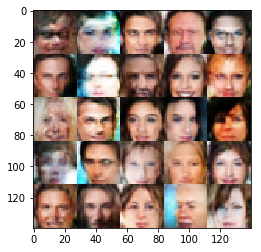

Epoch 1/1 ...  Discriminator loss = 1.083086 Generator loss = 1.126669
Epoch 1/1 ...  Discriminator loss = 0.768038 Generator loss = 1.230940
Epoch 1/1 ...  Discriminator loss = 0.781272 Generator loss = 1.425983
Epoch 1/1 ...  Discriminator loss = 1.333630 Generator loss = 0.624484
Epoch 1/1 ...  Discriminator loss = 1.032980 Generator loss = 0.668726
Epoch 1/1 ...  Discriminator loss = 1.345212 Generator loss = 0.544633
Epoch 1/1 ...  Discriminator loss = 0.845673 Generator loss = 1.304812
Epoch 1/1 ...  Discriminator loss = 1.211401 Generator loss = 0.919346
Epoch 1/1 ...  Discriminator loss = 0.957207 Generator loss = 0.862392
Epoch 1/1 ...  Discriminator loss = 1.063087 Generator loss = 0.916240


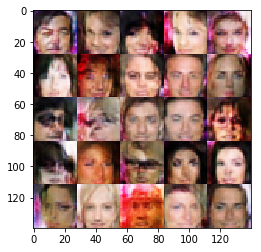

Epoch 1/1 ...  Discriminator loss = 1.072821 Generator loss = 1.115298
Epoch 1/1 ...  Discriminator loss = 1.182867 Generator loss = 0.797978
Epoch 1/1 ...  Discriminator loss = 0.897433 Generator loss = 1.071480
Epoch 1/1 ...  Discriminator loss = 1.239757 Generator loss = 0.732937
Epoch 1/1 ...  Discriminator loss = 1.197624 Generator loss = 0.855743
Epoch 1/1 ...  Discriminator loss = 1.227237 Generator loss = 0.835316
Epoch 1/1 ...  Discriminator loss = 1.460862 Generator loss = 0.776317
Epoch 1/1 ...  Discriminator loss = 1.432879 Generator loss = 0.939334
Epoch 1/1 ...  Discriminator loss = 1.223994 Generator loss = 1.024801
Epoch 1/1 ...  Discriminator loss = 1.345744 Generator loss = 0.746493


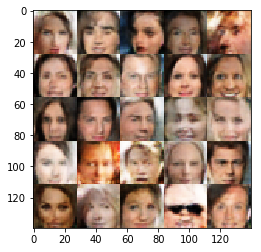

Epoch 1/1 ...  Discriminator loss = 1.089285 Generator loss = 0.813640
Epoch 1/1 ...  Discriminator loss = 1.578891 Generator loss = 0.517535
Epoch 1/1 ...  Discriminator loss = 1.132391 Generator loss = 0.941868
Epoch 1/1 ...  Discriminator loss = 1.383740 Generator loss = 0.736713
Epoch 1/1 ...  Discriminator loss = 1.142302 Generator loss = 0.667208
Epoch 1/1 ...  Discriminator loss = 1.075139 Generator loss = 1.223986
Epoch 1/1 ...  Discriminator loss = 0.681894 Generator loss = 1.288723
Epoch 1/1 ...  Discriminator loss = 1.046665 Generator loss = 0.909295
Epoch 1/1 ...  Discriminator loss = 1.456427 Generator loss = 0.506075
Epoch 1/1 ...  Discriminator loss = 1.363395 Generator loss = 0.684536


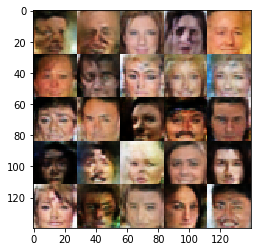

Epoch 1/1 ...  Discriminator loss = 1.306283 Generator loss = 0.629061
Epoch 1/1 ...  Discriminator loss = 1.206872 Generator loss = 0.684424
Epoch 1/1 ...  Discriminator loss = 1.207965 Generator loss = 0.643633
Epoch 1/1 ...  Discriminator loss = 1.095435 Generator loss = 0.840724
Epoch 1/1 ...  Discriminator loss = 1.398192 Generator loss = 0.611808
Epoch 1/1 ...  Discriminator loss = 1.372646 Generator loss = 1.061586
Epoch 1/1 ...  Discriminator loss = 0.869447 Generator loss = 1.077976
Epoch 1/1 ...  Discriminator loss = 1.542313 Generator loss = 0.901346
Epoch 1/1 ...  Discriminator loss = 1.153231 Generator loss = 0.951023
Epoch 1/1 ...  Discriminator loss = 1.083125 Generator loss = 0.811013


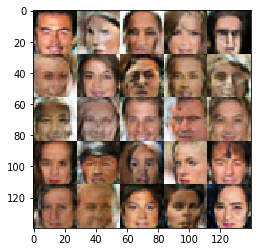

Epoch 1/1 ...  Discriminator loss = 1.714473 Generator loss = 0.556783
Epoch 1/1 ...  Discriminator loss = 1.183380 Generator loss = 0.812582
Epoch 1/1 ...  Discriminator loss = 1.133047 Generator loss = 1.169439
Epoch 1/1 ...  Discriminator loss = 1.214894 Generator loss = 0.778432
Epoch 1/1 ...  Discriminator loss = 1.159213 Generator loss = 0.817990
Epoch 1/1 ...  Discriminator loss = 1.516309 Generator loss = 0.890093
Epoch 1/1 ...  Discriminator loss = 1.024237 Generator loss = 1.029594
Epoch 1/1 ...  Discriminator loss = 1.700819 Generator loss = 0.598405
Epoch 1/1 ...  Discriminator loss = 1.729953 Generator loss = 0.490715
Epoch 1/1 ...  Discriminator loss = 0.989715 Generator loss = 0.858738


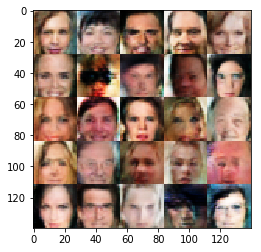

Epoch 1/1 ...  Discriminator loss = 0.945567 Generator loss = 1.127806
Epoch 1/1 ...  Discriminator loss = 0.983339 Generator loss = 1.154584
Epoch 1/1 ...  Discriminator loss = 1.372882 Generator loss = 0.805519
Epoch 1/1 ...  Discriminator loss = 1.509316 Generator loss = 0.489644
Epoch 1/1 ...  Discriminator loss = 1.127567 Generator loss = 0.917226
Epoch 1/1 ...  Discriminator loss = 0.953225 Generator loss = 1.029371
Epoch 1/1 ...  Discriminator loss = 1.140803 Generator loss = 0.834863
Epoch 1/1 ...  Discriminator loss = 1.610939 Generator loss = 0.485217
Epoch 1/1 ...  Discriminator loss = 1.190584 Generator loss = 0.901937
Epoch 1/1 ...  Discriminator loss = 1.024932 Generator loss = 1.052931


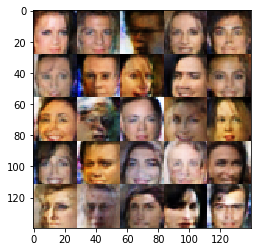

Epoch 1/1 ...  Discriminator loss = 1.199229 Generator loss = 0.815045
Epoch 1/1 ...  Discriminator loss = 1.515858 Generator loss = 0.586740
Epoch 1/1 ...  Discriminator loss = 1.078021 Generator loss = 1.006943
Epoch 1/1 ...  Discriminator loss = 1.197108 Generator loss = 0.842456
Epoch 1/1 ...  Discriminator loss = 1.475052 Generator loss = 0.610112
Epoch 1/1 ...  Discriminator loss = 0.865709 Generator loss = 0.890591
Epoch 1/1 ...  Discriminator loss = 1.781350 Generator loss = 0.506114
Epoch 1/1 ...  Discriminator loss = 1.259504 Generator loss = 0.727818
Epoch 1/1 ...  Discriminator loss = 1.030405 Generator loss = 0.764651
Epoch 1/1 ...  Discriminator loss = 1.234591 Generator loss = 0.669376


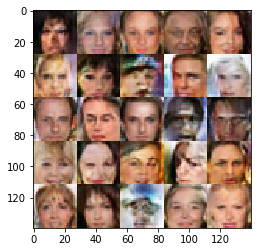

Epoch 1/1 ...  Discriminator loss = 1.194097 Generator loss = 0.813272
Epoch 1/1 ...  Discriminator loss = 1.291468 Generator loss = 0.663139
Epoch 1/1 ...  Discriminator loss = 0.948497 Generator loss = 1.097838
Epoch 1/1 ...  Discriminator loss = 1.323888 Generator loss = 0.938890
Epoch 1/1 ...  Discriminator loss = 1.022542 Generator loss = 0.828037
Epoch 1/1 ...  Discriminator loss = 0.902116 Generator loss = 1.247214
Epoch 1/1 ...  Discriminator loss = 1.262575 Generator loss = 0.793126
Epoch 1/1 ...  Discriminator loss = 1.122084 Generator loss = 1.196891
Epoch 1/1 ...  Discriminator loss = 1.023722 Generator loss = 0.797372
Epoch 1/1 ...  Discriminator loss = 1.046435 Generator loss = 1.006734


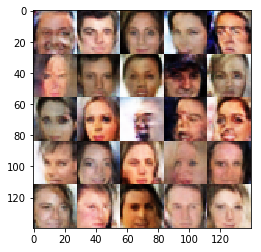

Epoch 1/1 ...  Discriminator loss = 1.077209 Generator loss = 1.202254
Epoch 1/1 ...  Discriminator loss = 1.206842 Generator loss = 1.049072
Epoch 1/1 ...  Discriminator loss = 1.489598 Generator loss = 0.742227
Epoch 1/1 ...  Discriminator loss = 1.327128 Generator loss = 0.682647
Epoch 1/1 ...  Discriminator loss = 1.124981 Generator loss = 0.881451
Epoch 1/1 ...  Discriminator loss = 0.947216 Generator loss = 0.954518
Epoch 1/1 ...  Discriminator loss = 0.922766 Generator loss = 1.266884
Epoch 1/1 ...  Discriminator loss = 1.477379 Generator loss = 0.833495
Epoch 1/1 ...  Discriminator loss = 0.994682 Generator loss = 1.215227
Epoch 1/1 ...  Discriminator loss = 1.536632 Generator loss = 0.629065


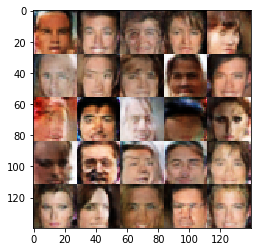

Epoch 1/1 ...  Discriminator loss = 1.292835 Generator loss = 0.894377
Epoch 1/1 ...  Discriminator loss = 1.126594 Generator loss = 0.825380
Epoch 1/1 ...  Discriminator loss = 0.974263 Generator loss = 1.222263
Epoch 1/1 ...  Discriminator loss = 1.188387 Generator loss = 0.748020
Epoch 1/1 ...  Discriminator loss = 1.435106 Generator loss = 0.699755
Epoch 1/1 ...  Discriminator loss = 1.222255 Generator loss = 0.757569
Epoch 1/1 ...  Discriminator loss = 1.001029 Generator loss = 1.214474
Epoch 1/1 ...  Discriminator loss = 1.240164 Generator loss = 0.702636
Epoch 1/1 ...  Discriminator loss = 1.398286 Generator loss = 0.783650
Epoch 1/1 ...  Discriminator loss = 1.268876 Generator loss = 0.850839


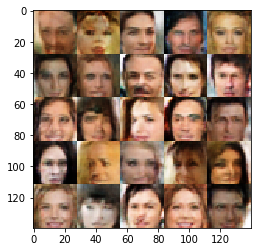

Epoch 1/1 ...  Discriminator loss = 0.785197 Generator loss = 1.471570
Epoch 1/1 ...  Discriminator loss = 2.044019 Generator loss = 0.411120
Epoch 1/1 ...  Discriminator loss = 0.949999 Generator loss = 1.021827
Epoch 1/1 ...  Discriminator loss = 1.071482 Generator loss = 0.840681
Epoch 1/1 ...  Discriminator loss = 1.155687 Generator loss = 0.848782
Epoch 1/1 ...  Discriminator loss = 1.035686 Generator loss = 0.893402
Epoch 1/1 ...  Discriminator loss = 1.138602 Generator loss = 0.656765
Epoch 1/1 ...  Discriminator loss = 1.677617 Generator loss = 0.451240
Epoch 1/1 ...  Discriminator loss = 1.033483 Generator loss = 1.042190
Epoch 1/1 ...  Discriminator loss = 1.267519 Generator loss = 0.750362


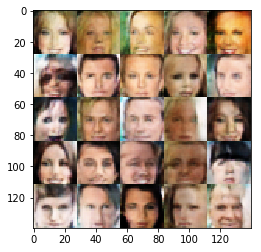

Epoch 1/1 ...  Discriminator loss = 1.041859 Generator loss = 1.143940
Epoch 1/1 ...  Discriminator loss = 1.356722 Generator loss = 0.686089
Epoch 1/1 ...  Discriminator loss = 0.901524 Generator loss = 1.674398
Epoch 1/1 ...  Discriminator loss = 1.181087 Generator loss = 0.800888
Epoch 1/1 ...  Discriminator loss = 0.948389 Generator loss = 0.986855
Epoch 1/1 ...  Discriminator loss = 0.903959 Generator loss = 1.058340
Epoch 1/1 ...  Discriminator loss = 1.116199 Generator loss = 1.147557
Epoch 1/1 ...  Discriminator loss = 1.313781 Generator loss = 0.609490
Epoch 1/1 ...  Discriminator loss = 0.923576 Generator loss = 1.027956
Epoch 1/1 ...  Discriminator loss = 1.508163 Generator loss = 0.611943


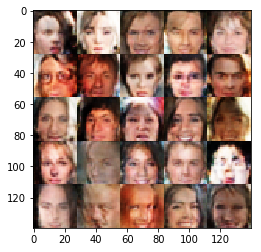

Epoch 1/1 ...  Discriminator loss = 0.733374 Generator loss = 1.206631
Epoch 1/1 ...  Discriminator loss = 0.891926 Generator loss = 1.275555
Epoch 1/1 ...  Discriminator loss = 1.074652 Generator loss = 1.125390
Epoch 1/1 ...  Discriminator loss = 1.311649 Generator loss = 0.755891
Epoch 1/1 ...  Discriminator loss = 1.172831 Generator loss = 0.575271
Epoch 1/1 ...  Discriminator loss = 1.018425 Generator loss = 0.981892
Epoch 1/1 ...  Discriminator loss = 1.478556 Generator loss = 0.873725
Epoch 1/1 ...  Discriminator loss = 1.059516 Generator loss = 0.648352
Epoch 1/1 ...  Discriminator loss = 1.292151 Generator loss = 0.715889
Epoch 1/1 ...  Discriminator loss = 1.149774 Generator loss = 0.716858


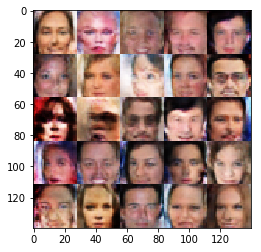

Epoch 1/1 ...  Discriminator loss = 0.861363 Generator loss = 1.603409
Epoch 1/1 ...  Discriminator loss = 0.991098 Generator loss = 1.127583
Epoch 1/1 ...  Discriminator loss = 1.084029 Generator loss = 0.801065
Epoch 1/1 ...  Discriminator loss = 1.172946 Generator loss = 0.675369
Epoch 1/1 ...  Discriminator loss = 1.452601 Generator loss = 0.752457
Epoch 1/1 ...  Discriminator loss = 0.831814 Generator loss = 1.190230
Epoch 1/1 ...  Discriminator loss = 1.119488 Generator loss = 0.796514
Epoch 1/1 ...  Discriminator loss = 1.061317 Generator loss = 1.222387
Epoch 1/1 ...  Discriminator loss = 1.314614 Generator loss = 0.889827
Epoch 1/1 ...  Discriminator loss = 1.186431 Generator loss = 0.873581


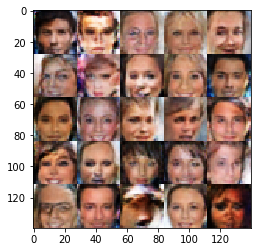

Epoch 1/1 ...  Discriminator loss = 1.103991 Generator loss = 1.049855
Epoch 1/1 ...  Discriminator loss = 1.179550 Generator loss = 0.744656
Epoch 1/1 ...  Discriminator loss = 1.071844 Generator loss = 0.683553
Epoch 1/1 ...  Discriminator loss = 1.036780 Generator loss = 0.795220
Epoch 1/1 ...  Discriminator loss = 0.808172 Generator loss = 1.158587
Epoch 1/1 ...  Discriminator loss = 0.874905 Generator loss = 1.296922
Epoch 1/1 ...  Discriminator loss = 1.262654 Generator loss = 0.923153
Epoch 1/1 ...  Discriminator loss = 1.067030 Generator loss = 0.999855
Epoch 1/1 ...  Discriminator loss = 1.511462 Generator loss = 0.903303
Epoch 1/1 ...  Discriminator loss = 1.185081 Generator loss = 0.788178


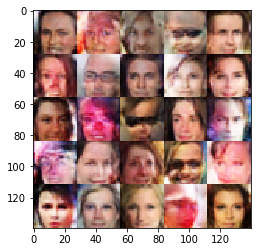

Epoch 1/1 ...  Discriminator loss = 0.990006 Generator loss = 0.755240
Epoch 1/1 ...  Discriminator loss = 1.550728 Generator loss = 0.654002
Epoch 1/1 ...  Discriminator loss = 1.163407 Generator loss = 1.038247
Epoch 1/1 ...  Discriminator loss = 1.602518 Generator loss = 0.836548
Epoch 1/1 ...  Discriminator loss = 1.302996 Generator loss = 0.934435
Epoch 1/1 ...  Discriminator loss = 1.268294 Generator loss = 1.073332
Epoch 1/1 ...  Discriminator loss = 1.195227 Generator loss = 0.743924
Epoch 1/1 ...  Discriminator loss = 1.068759 Generator loss = 0.797859
Epoch 1/1 ...  Discriminator loss = 0.907017 Generator loss = 0.777358
Epoch 1/1 ...  Discriminator loss = 1.579064 Generator loss = 0.734341


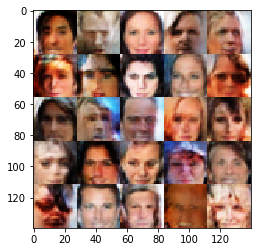

Epoch 1/1 ...  Discriminator loss = 1.231446 Generator loss = 0.830452
Epoch 1/1 ...  Discriminator loss = 1.128788 Generator loss = 0.784275
Epoch 1/1 ...  Discriminator loss = 0.942604 Generator loss = 1.182544
Epoch 1/1 ...  Discriminator loss = 1.325789 Generator loss = 0.551777
Epoch 1/1 ...  Discriminator loss = 1.273520 Generator loss = 0.983723
Epoch 1/1 ...  Discriminator loss = 1.513667 Generator loss = 0.869949
Epoch 1/1 ...  Discriminator loss = 1.248880 Generator loss = 0.958734
Epoch 1/1 ...  Discriminator loss = 1.243505 Generator loss = 0.888829
Epoch 1/1 ...  Discriminator loss = 1.052984 Generator loss = 0.842971
Epoch 1/1 ...  Discriminator loss = 1.200696 Generator loss = 0.764113


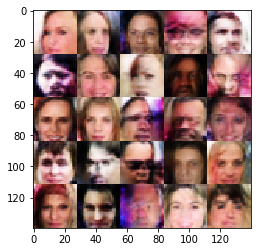

Epoch 1/1 ...  Discriminator loss = 1.361509 Generator loss = 0.747452
Epoch 1/1 ...  Discriminator loss = 1.499159 Generator loss = 0.517187
Epoch 1/1 ...  Discriminator loss = 1.152217 Generator loss = 0.864309
Epoch 1/1 ...  Discriminator loss = 1.249755 Generator loss = 0.737978
Epoch 1/1 ...  Discriminator loss = 0.931793 Generator loss = 0.935990
Epoch 1/1 ...  Discriminator loss = 1.165787 Generator loss = 0.962975
Epoch 1/1 ...  Discriminator loss = 1.051145 Generator loss = 0.783977
Epoch 1/1 ...  Discriminator loss = 1.367431 Generator loss = 0.687859
Epoch 1/1 ...  Discriminator loss = 1.010732 Generator loss = 0.781511
Epoch 1/1 ...  Discriminator loss = 1.408624 Generator loss = 0.778351


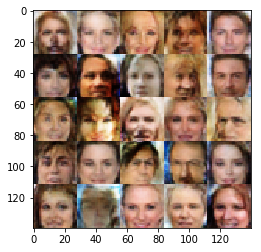

Epoch 1/1 ...  Discriminator loss = 1.397385 Generator loss = 0.784238
Epoch 1/1 ...  Discriminator loss = 1.596175 Generator loss = 0.567142
Epoch 1/1 ...  Discriminator loss = 1.471259 Generator loss = 0.692104
Epoch 1/1 ...  Discriminator loss = 1.451465 Generator loss = 0.532682
Epoch 1/1 ...  Discriminator loss = 0.854688 Generator loss = 1.233588
Epoch 1/1 ...  Discriminator loss = 1.153206 Generator loss = 0.668754
Epoch 1/1 ...  Discriminator loss = 1.580045 Generator loss = 0.523995
Epoch 1/1 ...  Discriminator loss = 0.945142 Generator loss = 1.058657
Epoch 1/1 ...  Discriminator loss = 0.950268 Generator loss = 0.867170
Epoch 1/1 ...  Discriminator loss = 1.065390 Generator loss = 0.912577


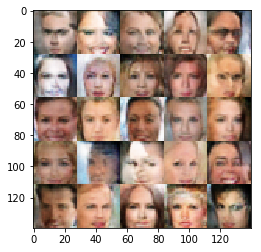

Epoch 1/1 ...  Discriminator loss = 1.124705 Generator loss = 0.906325
Epoch 1/1 ...  Discriminator loss = 1.074160 Generator loss = 1.160492
Epoch 1/1 ...  Discriminator loss = 1.289858 Generator loss = 0.828218
Epoch 1/1 ...  Discriminator loss = 1.165109 Generator loss = 1.026021
Epoch 1/1 ...  Discriminator loss = 1.428969 Generator loss = 0.771563
Epoch 1/1 ...  Discriminator loss = 1.529638 Generator loss = 0.565061
Epoch 1/1 ...  Discriminator loss = 1.056367 Generator loss = 0.894736
Epoch 1/1 ...  Discriminator loss = 1.415411 Generator loss = 0.577821
Epoch 1/1 ...  Discriminator loss = 1.342838 Generator loss = 0.821204
Epoch 1/1 ...  Discriminator loss = 1.433889 Generator loss = 0.901956


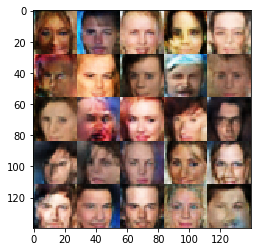

Epoch 1/1 ...  Discriminator loss = 1.540434 Generator loss = 0.752471
Epoch 1/1 ...  Discriminator loss = 1.369060 Generator loss = 0.766965
Epoch 1/1 ...  Discriminator loss = 1.373901 Generator loss = 0.765853
Epoch 1/1 ...  Discriminator loss = 1.661716 Generator loss = 0.585271
Epoch 1/1 ...  Discriminator loss = 1.052688 Generator loss = 0.990539
Epoch 1/1 ...  Discriminator loss = 1.295117 Generator loss = 0.658833
Epoch 1/1 ...  Discriminator loss = 1.577664 Generator loss = 0.540889
Epoch 1/1 ...  Discriminator loss = 0.777653 Generator loss = 0.921582
Epoch 1/1 ...  Discriminator loss = 1.153183 Generator loss = 0.879296
Epoch 1/1 ...  Discriminator loss = 1.537929 Generator loss = 0.708330


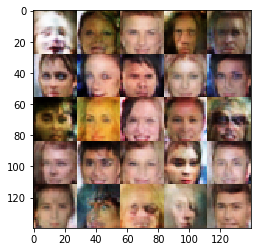

Epoch 1/1 ...  Discriminator loss = 1.257161 Generator loss = 0.897188
Epoch 1/1 ...  Discriminator loss = 1.081425 Generator loss = 0.688783
Epoch 1/1 ...  Discriminator loss = 1.427368 Generator loss = 0.610072
Epoch 1/1 ...  Discriminator loss = 0.952080 Generator loss = 1.194054
Epoch 1/1 ...  Discriminator loss = 1.182243 Generator loss = 0.910518
Epoch 1/1 ...  Discriminator loss = 1.740575 Generator loss = 0.375055
Epoch 1/1 ...  Discriminator loss = 1.590512 Generator loss = 0.521696
Epoch 1/1 ...  Discriminator loss = 1.356705 Generator loss = 0.616710
Epoch 1/1 ...  Discriminator loss = 0.863573 Generator loss = 1.157659
Epoch 1/1 ...  Discriminator loss = 1.358351 Generator loss = 0.864340


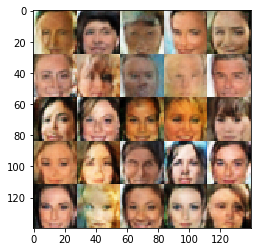

Epoch 1/1 ...  Discriminator loss = 1.527125 Generator loss = 0.623932
Epoch 1/1 ...  Discriminator loss = 1.487354 Generator loss = 0.831017
Epoch 1/1 ...  Discriminator loss = 1.709084 Generator loss = 0.518877
Epoch 1/1 ...  Discriminator loss = 1.184234 Generator loss = 0.822283
Epoch 1/1 ...  Discriminator loss = 0.884063 Generator loss = 1.009333
Epoch 1/1 ...  Discriminator loss = 1.266109 Generator loss = 0.878491
Epoch 1/1 ...  Discriminator loss = 1.056910 Generator loss = 0.825702
Epoch 1/1 ...  Discriminator loss = 0.774574 Generator loss = 1.374151
Epoch 1/1 ...  Discriminator loss = 1.326608 Generator loss = 0.672116
Epoch 1/1 ...  Discriminator loss = 1.205334 Generator loss = 0.996757


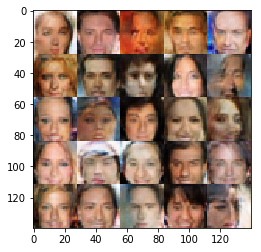

Epoch 1/1 ...  Discriminator loss = 1.136894 Generator loss = 0.993858
Epoch 1/1 ...  Discriminator loss = 1.317845 Generator loss = 0.712231
Epoch 1/1 ...  Discriminator loss = 1.100470 Generator loss = 0.794495
Epoch 1/1 ...  Discriminator loss = 1.116087 Generator loss = 1.104891
Epoch 1/1 ...  Discriminator loss = 0.896037 Generator loss = 1.058346
Epoch 1/1 ...  Discriminator loss = 1.383791 Generator loss = 0.838560
Epoch 1/1 ...  Discriminator loss = 1.233843 Generator loss = 0.808565
Epoch 1/1 ...  Discriminator loss = 0.984734 Generator loss = 1.021870
Epoch 1/1 ...  Discriminator loss = 0.836862 Generator loss = 1.292816
Epoch 1/1 ...  Discriminator loss = 0.950099 Generator loss = 0.989309


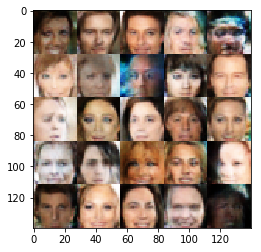

Epoch 1/1 ...  Discriminator loss = 1.131034 Generator loss = 0.963723
Epoch 1/1 ...  Discriminator loss = 1.212877 Generator loss = 0.835767
Epoch 1/1 ...  Discriminator loss = 0.940305 Generator loss = 1.098552
Epoch 1/1 ...  Discriminator loss = 0.914881 Generator loss = 1.102947
Epoch 1/1 ...  Discriminator loss = 1.100977 Generator loss = 1.305234
Epoch 1/1 ...  Discriminator loss = 1.185151 Generator loss = 1.176223
Epoch 1/1 ...  Discriminator loss = 1.104882 Generator loss = 0.818805
Epoch 1/1 ...  Discriminator loss = 0.996558 Generator loss = 0.713184
Epoch 1/1 ...  Discriminator loss = 1.212974 Generator loss = 0.835837
Epoch 1/1 ...  Discriminator loss = 1.047958 Generator loss = 0.904107


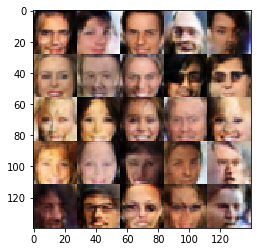

Epoch 1/1 ...  Discriminator loss = 1.109135 Generator loss = 0.918272
Epoch 1/1 ...  Discriminator loss = 0.644808 Generator loss = 1.142025
Epoch 1/1 ...  Discriminator loss = 2.346214 Generator loss = 0.381565
Epoch 1/1 ...  Discriminator loss = 0.833611 Generator loss = 1.126034
Epoch 1/1 ...  Discriminator loss = 1.336652 Generator loss = 0.596065
Epoch 1/1 ...  Discriminator loss = 1.177002 Generator loss = 0.658878
Epoch 1/1 ...  Discriminator loss = 0.837805 Generator loss = 1.124920
Epoch 1/1 ...  Discriminator loss = 1.037691 Generator loss = 1.257233
Epoch 1/1 ...  Discriminator loss = 1.053653 Generator loss = 0.748230
Epoch 1/1 ...  Discriminator loss = 1.038876 Generator loss = 1.105747


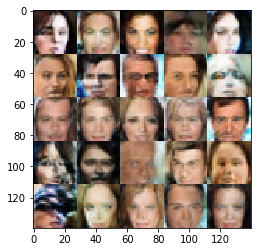

Epoch 1/1 ...  Discriminator loss = 0.923960 Generator loss = 0.996524
Epoch 1/1 ...  Discriminator loss = 1.184243 Generator loss = 0.705176
Epoch 1/1 ...  Discriminator loss = 1.227221 Generator loss = 0.715498
Epoch 1/1 ...  Discriminator loss = 0.895095 Generator loss = 1.537388
Epoch 1/1 ...  Discriminator loss = 1.211624 Generator loss = 1.328872
Epoch 1/1 ...  Discriminator loss = 1.082216 Generator loss = 0.853457
Epoch 1/1 ...  Discriminator loss = 0.826161 Generator loss = 1.324738
Epoch 1/1 ...  Discriminator loss = 1.035235 Generator loss = 1.189997
Epoch 1/1 ...  Discriminator loss = 1.445829 Generator loss = 0.917425
Epoch 1/1 ...  Discriminator loss = 1.118454 Generator loss = 0.843168


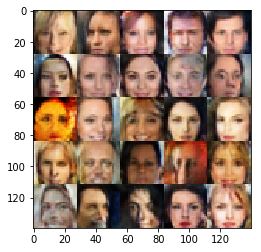

Epoch 1/1 ...  Discriminator loss = 1.396079 Generator loss = 0.944713
Epoch 1/1 ...  Discriminator loss = 1.229419 Generator loss = 0.696386
Epoch 1/1 ...  Discriminator loss = 1.171712 Generator loss = 0.925694
Epoch 1/1 ...  Discriminator loss = 1.267432 Generator loss = 0.945035
Epoch 1/1 ...  Discriminator loss = 0.914900 Generator loss = 1.133710
Epoch 1/1 ...  Discriminator loss = 0.922832 Generator loss = 1.537670
Epoch 1/1 ...  Discriminator loss = 1.357100 Generator loss = 0.636852
Epoch 1/1 ...  Discriminator loss = 0.827106 Generator loss = 0.847592
Epoch 1/1 ...  Discriminator loss = 0.868569 Generator loss = 0.986845
Epoch 1/1 ...  Discriminator loss = 1.158445 Generator loss = 0.847166


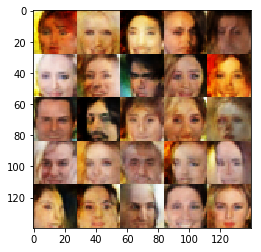

Epoch 1/1 ...  Discriminator loss = 1.417739 Generator loss = 0.659098
Epoch 1/1 ...  Discriminator loss = 1.384822 Generator loss = 0.627544
Epoch 1/1 ...  Discriminator loss = 1.476245 Generator loss = 0.550496
Epoch 1/1 ...  Discriminator loss = 1.168181 Generator loss = 0.786203
Epoch 1/1 ...  Discriminator loss = 1.207084 Generator loss = 0.847378
Epoch 1/1 ...  Discriminator loss = 1.744103 Generator loss = 0.700913
Epoch 1/1 ...  Discriminator loss = 1.422118 Generator loss = 0.755331
Epoch 1/1 ...  Discriminator loss = 1.415082 Generator loss = 0.696193
Epoch 1/1 ...  Discriminator loss = 1.155032 Generator loss = 0.946610
Epoch 1/1 ...  Discriminator loss = 0.965526 Generator loss = 1.028022


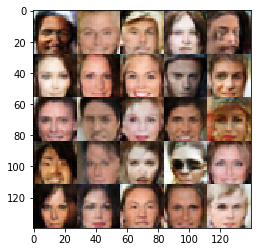

Epoch 1/1 ...  Discriminator loss = 0.949274 Generator loss = 0.973935
Epoch 1/1 ...  Discriminator loss = 1.020268 Generator loss = 0.741482
Epoch 1/1 ...  Discriminator loss = 1.119714 Generator loss = 1.052278
Epoch 1/1 ...  Discriminator loss = 1.632784 Generator loss = 0.612520
Epoch 1/1 ...  Discriminator loss = 1.227081 Generator loss = 0.911567
Epoch 1/1 ...  Discriminator loss = 1.219146 Generator loss = 0.888002
Epoch 1/1 ...  Discriminator loss = 1.062689 Generator loss = 0.598388
Epoch 1/1 ...  Discriminator loss = 0.956880 Generator loss = 0.821504
Epoch 1/1 ...  Discriminator loss = 1.181191 Generator loss = 0.880312
Epoch 1/1 ...  Discriminator loss = 1.397982 Generator loss = 0.801431


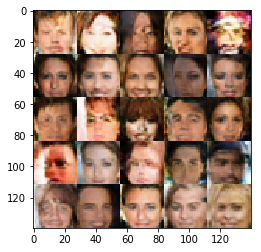

Epoch 1/1 ...  Discriminator loss = 1.571509 Generator loss = 0.620311
Epoch 1/1 ...  Discriminator loss = 1.035572 Generator loss = 0.925931
Epoch 1/1 ...  Discriminator loss = 1.311542 Generator loss = 0.846597
Epoch 1/1 ...  Discriminator loss = 1.524501 Generator loss = 0.596466
Epoch 1/1 ...  Discriminator loss = 1.128524 Generator loss = 0.739753
Epoch 1/1 ...  Discriminator loss = 1.279065 Generator loss = 0.909067
Epoch 1/1 ...  Discriminator loss = 1.405621 Generator loss = 0.659369
Epoch 1/1 ...  Discriminator loss = 1.291455 Generator loss = 0.932099
Epoch 1/1 ...  Discriminator loss = 0.809013 Generator loss = 1.080120
Epoch 1/1 ...  Discriminator loss = 1.395183 Generator loss = 0.640306


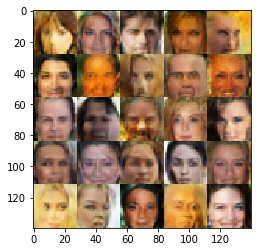

Epoch 1/1 ...  Discriminator loss = 0.924932 Generator loss = 0.916890
Epoch 1/1 ...  Discriminator loss = 1.122027 Generator loss = 1.077403
Epoch 1/1 ...  Discriminator loss = 1.413205 Generator loss = 0.718075
Epoch 1/1 ...  Discriminator loss = 1.419026 Generator loss = 0.615387
Epoch 1/1 ...  Discriminator loss = 1.050748 Generator loss = 0.991326
Epoch 1/1 ...  Discriminator loss = 1.265407 Generator loss = 0.971833
Epoch 1/1 ...  Discriminator loss = 1.250068 Generator loss = 0.682347
Epoch 1/1 ...  Discriminator loss = 0.857560 Generator loss = 1.256911
Epoch 1/1 ...  Discriminator loss = 1.349612 Generator loss = 0.709185
Epoch 1/1 ...  Discriminator loss = 1.049791 Generator loss = 1.048576


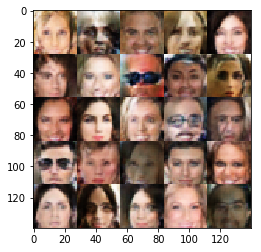

Epoch 1/1 ...  Discriminator loss = 1.803219 Generator loss = 0.628242
Epoch 1/1 ...  Discriminator loss = 1.503503 Generator loss = 0.637271
Epoch 1/1 ...  Discriminator loss = 0.612474 Generator loss = 1.531157
Epoch 1/1 ...  Discriminator loss = 0.874986 Generator loss = 1.034860
Epoch 1/1 ...  Discriminator loss = 1.380973 Generator loss = 0.870220
Epoch 1/1 ...  Discriminator loss = 0.930231 Generator loss = 1.310021
Epoch 1/1 ...  Discriminator loss = 0.932799 Generator loss = 1.312201
Epoch 1/1 ...  Discriminator loss = 0.750463 Generator loss = 1.487438
Epoch 1/1 ...  Discriminator loss = 1.378721 Generator loss = 0.510393
Epoch 1/1 ...  Discriminator loss = 1.055506 Generator loss = 1.008722


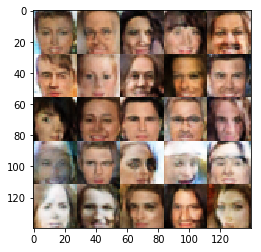

Epoch 1/1 ...  Discriminator loss = 1.281550 Generator loss = 0.688258
Epoch 1/1 ...  Discriminator loss = 1.243495 Generator loss = 0.901463
Epoch 1/1 ...  Discriminator loss = 1.268217 Generator loss = 0.684538
Epoch 1/1 ...  Discriminator loss = 1.227249 Generator loss = 1.027347
Epoch 1/1 ...  Discriminator loss = 1.383400 Generator loss = 0.602129
Epoch 1/1 ...  Discriminator loss = 1.095852 Generator loss = 1.162893
Epoch 1/1 ...  Discriminator loss = 1.206869 Generator loss = 0.952066
Epoch 1/1 ...  Discriminator loss = 0.900731 Generator loss = 1.269237
Epoch 1/1 ...  Discriminator loss = 0.772893 Generator loss = 1.322927
Epoch 1/1 ...  Discriminator loss = 1.038935 Generator loss = 0.998623


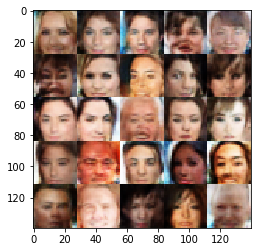

Epoch 1/1 ...  Discriminator loss = 1.124284 Generator loss = 0.777576
Epoch 1/1 ...  Discriminator loss = 1.216161 Generator loss = 0.794816
Epoch 1/1 ...  Discriminator loss = 1.237909 Generator loss = 0.792554
Epoch 1/1 ...  Discriminator loss = 0.994903 Generator loss = 1.012383
Epoch 1/1 ...  Discriminator loss = 0.966399 Generator loss = 0.935771
Epoch 1/1 ...  Discriminator loss = 0.883027 Generator loss = 1.553540
Epoch 1/1 ...  Discriminator loss = 1.410252 Generator loss = 0.825108
Epoch 1/1 ...  Discriminator loss = 1.725248 Generator loss = 0.810714
Epoch 1/1 ...  Discriminator loss = 0.834465 Generator loss = 1.155327
Epoch 1/1 ...  Discriminator loss = 1.307796 Generator loss = 0.644068


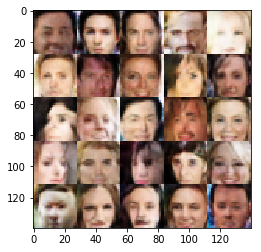

Epoch 1/1 ...  Discriminator loss = 0.860028 Generator loss = 0.812116
Epoch 1/1 ...  Discriminator loss = 0.974456 Generator loss = 1.004880
Epoch 1/1 ...  Discriminator loss = 1.046101 Generator loss = 0.917452
Epoch 1/1 ...  Discriminator loss = 0.996342 Generator loss = 0.986154
Epoch 1/1 ...  Discriminator loss = 0.984753 Generator loss = 0.708865
Epoch 1/1 ...  Discriminator loss = 1.053598 Generator loss = 1.010745
Epoch 1/1 ...  Discriminator loss = 0.661649 Generator loss = 1.587174
Epoch 1/1 ...  Discriminator loss = 1.360380 Generator loss = 0.626189
Epoch 1/1 ...  Discriminator loss = 1.651813 Generator loss = 0.546415
Epoch 1/1 ...  Discriminator loss = 1.282448 Generator loss = 0.595177


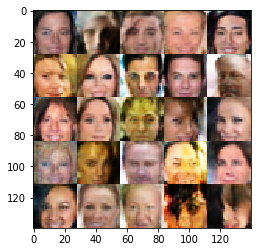

Epoch 1/1 ...  Discriminator loss = 1.312327 Generator loss = 0.730144
Epoch 1/1 ...  Discriminator loss = 0.941929 Generator loss = 1.089499
Epoch 1/1 ...  Discriminator loss = 1.178922 Generator loss = 0.781489
Epoch 1/1 ...  Discriminator loss = 2.243538 Generator loss = 0.393849
Epoch 1/1 ...  Discriminator loss = 1.361799 Generator loss = 0.784303
Epoch 1/1 ...  Discriminator loss = 1.202723 Generator loss = 0.934894
Epoch 1/1 ...  Discriminator loss = 1.163377 Generator loss = 1.012848
Epoch 1/1 ...  Discriminator loss = 1.076855 Generator loss = 0.822521
Epoch 1/1 ...  Discriminator loss = 1.222426 Generator loss = 0.805207
Epoch 1/1 ...  Discriminator loss = 0.658083 Generator loss = 1.322663


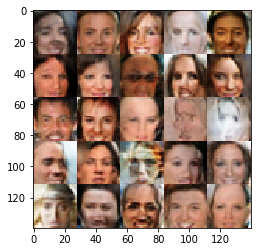

Epoch 1/1 ...  Discriminator loss = 0.938975 Generator loss = 0.953947
Epoch 1/1 ...  Discriminator loss = 1.025299 Generator loss = 1.107270
Epoch 1/1 ...  Discriminator loss = 1.200113 Generator loss = 0.982124
Epoch 1/1 ...  Discriminator loss = 0.924925 Generator loss = 1.028193
Epoch 1/1 ...  Discriminator loss = 0.889811 Generator loss = 1.269274
Epoch 1/1 ...  Discriminator loss = 1.153056 Generator loss = 0.779362
Epoch 1/1 ...  Discriminator loss = 1.489197 Generator loss = 0.573590
Epoch 1/1 ...  Discriminator loss = 1.682400 Generator loss = 0.631445
Epoch 1/1 ...  Discriminator loss = 1.030604 Generator loss = 0.986915
Epoch 1/1 ...  Discriminator loss = 1.177940 Generator loss = 0.738741


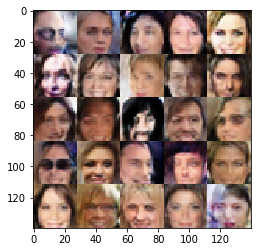

Epoch 1/1 ...  Discriminator loss = 1.016146 Generator loss = 0.748900
Epoch 1/1 ...  Discriminator loss = 1.265809 Generator loss = 0.768401
Epoch 1/1 ...  Discriminator loss = 1.124792 Generator loss = 0.864416
Epoch 1/1 ...  Discriminator loss = 0.797999 Generator loss = 1.092775
Epoch 1/1 ...  Discriminator loss = 0.926602 Generator loss = 1.479571
Epoch 1/1 ...  Discriminator loss = 0.847906 Generator loss = 1.154373
Epoch 1/1 ...  Discriminator loss = 0.908875 Generator loss = 1.214745
Epoch 1/1 ...  Discriminator loss = 1.670780 Generator loss = 0.594420
Epoch 1/1 ...  Discriminator loss = 1.246573 Generator loss = 0.780875
Epoch 1/1 ...  Discriminator loss = 1.051539 Generator loss = 0.943541


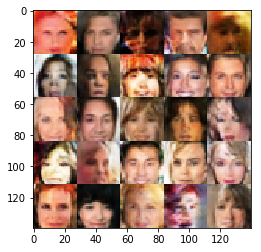

Epoch 1/1 ...  Discriminator loss = 1.242947 Generator loss = 0.782295
Epoch 1/1 ...  Discriminator loss = 1.249369 Generator loss = 0.707416
Epoch 1/1 ...  Discriminator loss = 1.614923 Generator loss = 0.482801
Epoch 1/1 ...  Discriminator loss = 1.064037 Generator loss = 0.919196
Epoch 1/1 ...  Discriminator loss = 0.845851 Generator loss = 1.295309
Epoch 1/1 ...  Discriminator loss = 1.835924 Generator loss = 0.566804
Epoch 1/1 ...  Discriminator loss = 1.227813 Generator loss = 0.679550
Epoch 1/1 ...  Discriminator loss = 1.225591 Generator loss = 0.852707
Epoch 1/1 ...  Discriminator loss = 1.396270 Generator loss = 0.719304
Epoch 1/1 ...  Discriminator loss = 1.663077 Generator loss = 0.708831


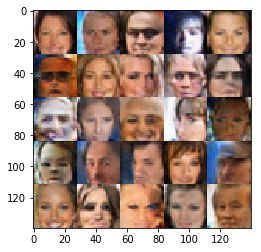

Epoch 1/1 ...  Discriminator loss = 0.971058 Generator loss = 1.483772
Epoch 1/1 ...  Discriminator loss = 0.802655 Generator loss = 1.031362
Epoch 1/1 ...  Discriminator loss = 1.222172 Generator loss = 0.675313
Epoch 1/1 ...  Discriminator loss = 1.387601 Generator loss = 0.512063
Epoch 1/1 ...  Discriminator loss = 1.111356 Generator loss = 1.026701
Epoch 1/1 ...  Discriminator loss = 0.974192 Generator loss = 0.932784
Epoch 1/1 ...  Discriminator loss = 1.303760 Generator loss = 0.703171
Epoch 1/1 ...  Discriminator loss = 0.929252 Generator loss = 1.181520
Epoch 1/1 ...  Discriminator loss = 0.592172 Generator loss = 1.747741
Epoch 1/1 ...  Discriminator loss = 1.108025 Generator loss = 0.879829


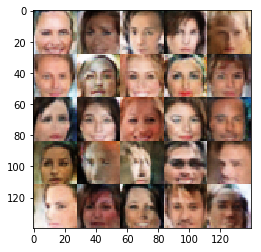

Epoch 1/1 ...  Discriminator loss = 1.179894 Generator loss = 0.854152
Epoch 1/1 ...  Discriminator loss = 1.449602 Generator loss = 0.629618
Epoch 1/1 ...  Discriminator loss = 0.910794 Generator loss = 1.406028
Epoch 1/1 ...  Discriminator loss = 1.270510 Generator loss = 0.699296
Epoch 1/1 ...  Discriminator loss = 1.643140 Generator loss = 0.519357
Epoch 1/1 ...  Discriminator loss = 1.289993 Generator loss = 0.836249
Epoch 1/1 ...  Discriminator loss = 1.304957 Generator loss = 0.642030
Epoch 1/1 ...  Discriminator loss = 1.607194 Generator loss = 0.695079
Epoch 1/1 ...  Discriminator loss = 1.056040 Generator loss = 0.925931
Epoch 1/1 ...  Discriminator loss = 1.047878 Generator loss = 1.013265


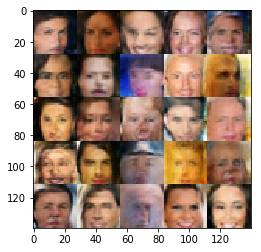

Epoch 1/1 ...  Discriminator loss = 1.367260 Generator loss = 0.662855
Epoch 1/1 ...  Discriminator loss = 0.983187 Generator loss = 1.341848
Epoch 1/1 ...  Discriminator loss = 0.863738 Generator loss = 1.050272
Epoch 1/1 ...  Discriminator loss = 1.192353 Generator loss = 0.893706
Epoch 1/1 ...  Discriminator loss = 1.308930 Generator loss = 0.914208
Epoch 1/1 ...  Discriminator loss = 1.233683 Generator loss = 0.684780


In [13]:

batch_size = 16
z_dim = 100
learning_rate = 0.0001
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.